In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("ashkhagan/figshare-brain-tumor-dataset")

print("Path to dataset files:", path)

100%|██████████| 839M/839M [00:43<00:00, 20.4MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/ashkhagan/figshare-brain-tumor-dataset/versions/1


Using device: cuda:0
GPU Name: Tesla T4
Total GPU Memory: 14.74 GB
Total .mat data files found: 3064
Train files: 2451 Validation files: 613


/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_BN_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19

Hybrid Model Architecture:
HybridModel(
  (vgg): VGG(
    (features): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
      (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (9): ReLU(inplace=True)
      (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (12): ReLU(inplace=True)
      (13): MaxPool2d(kernel_size

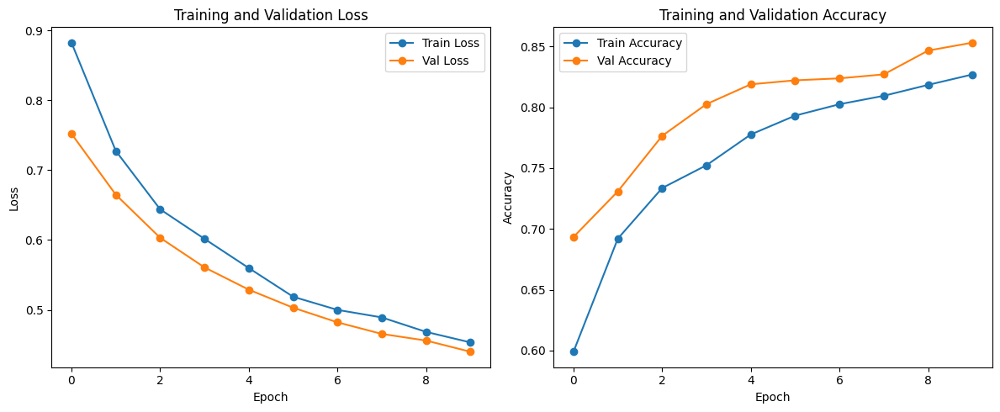

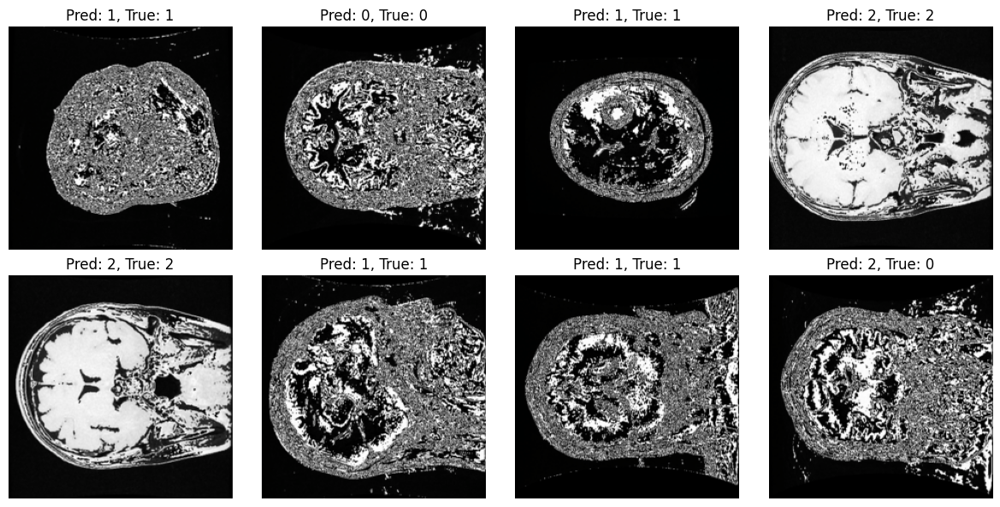


--- Computing Details ---
Device: cuda:0
GPU Name: Tesla T4
Total GPU Memory: 14.74 GB
Allocated GPU Memory: 0.86 GB
Cached GPU Memory: 3.01 GB


In [ ]:
import os
import glob
import numpy as np
import h5py
from PIL import Image
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from torchvision import models

# --------------------------
# Device and GPU Information
# --------------------------
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)
if device.type == "cuda":
    gpu_props = torch.cuda.get_device_properties(0)
    print("GPU Name:", torch.cuda.get_device_name(0))
    print("Total GPU Memory: {:.2f} GB".format(gpu_props.total_memory / (1024**3)))

# --------------------------
# Function to Load MATLAB Files using h5py
# --------------------------
def load_matlab_file(file_path):
    """
    Load a MATLAB file saved in v7.3 format using h5py.
    This function first checks for a 'cjdata' group and returns its fields.
    If not found, it loads keys from the top level.
    """
    with h5py.File(file_path, 'r') as f:
        if "cjdata" in f:
            group = f["cjdata"]
            label = group["label"][()]
            image = group["image"][()]
            tumorBorder = group["tumorBorder"][()] if "tumorBorder" in group else None
            tumorMask = group["tumorMask"][()] if "tumorMask" in group else None
            PID = group["PID"][()] if "PID" in group else None
            return {"label": label, "image": image, "tumorBorder": tumorBorder, "tumorMask": tumorMask, "PID": PID}
        else:
            # Fallback: return all keys in the file
            data = {k: f[k][()] for k in f.keys()}
            return data

# --------------------------
# Custom Dataset Definition
# --------------------------
class BrainTumorDataset(Dataset):
    def __init__(self, file_list, transform=None):
        self.file_list = file_list
        self.transform = transform

    def __len__(self):
        return len(self.file_list)

    def __getitem__(self, idx):
        file_path = self.file_list[idx]
        data = load_matlab_file(file_path)

        if "label" not in data:
            raise KeyError(f"'label' not found in file: {file_path}")
        label = data["label"]
        # Squeeze dimensions in case label is stored as an array (e.g., shape (1,1))
        label = int(np.squeeze(label))

        if "image" not in data:
            raise KeyError(f"'image' not found in file: {file_path}")
        image = data["image"]
        # If grayscale, convert to 3 channels.
        if image.ndim == 2:
            image = np.stack([image] * 3, axis=-1)
        # Normalize image to uint8 if necessary.
        if image.dtype != np.uint8:
            image = (255 * (image - np.min(image)) / (np.ptp(image) + 1e-8)).astype(np.uint8)

        image = Image.fromarray(image)
        if self.transform:
            image = self.transform(image)
        # Adjust label from 1-indexed (MATLAB) to 0-indexed.
        return image, label - 1

# --------------------------
# Data Transforms & Preprocessing
# --------------------------
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ]),
}

# --------------------------
# Prepare Dataset and DataLoaders
# --------------------------
# Path to the dataset directory
dataset_dir = "/root/.cache/kagglehub/datasets/ashkhagan/figshare-brain-tumor-dataset/versions/1"
# Get all .mat files recursively but filter out files like "cvind.mat"
all_files = glob.glob(os.path.join(dataset_dir, '**', '*.mat'), recursive=True)
all_files = [f for f in all_files if "cvind" not in os.path.basename(f).lower()]
print("Total .mat data files found:", len(all_files))

# Shuffle and split into training (80%) and validation (20%) sets.
np.random.shuffle(all_files)
split_idx = int(0.8 * len(all_files))
train_files = all_files[:split_idx]
val_files = all_files[split_idx:]
print("Train files:", len(train_files), "Validation files:", len(val_files))

train_dataset = BrainTumorDataset(train_files, transform=data_transforms['train'])
val_dataset = BrainTumorDataset(val_files, transform=data_transforms['val'])

batch_size = 16
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

# --------------------------
# Define the Hybrid Model (VGG19 + ViT)
# --------------------------
class HybridModel(nn.Module):
    def __init__(self, num_classes, use_pretrained=True, feature_extract=True):
        super(HybridModel, self).__init__()

        # VGG19 with batch normalization
        self.vgg = models.vgg19_bn(pretrained=use_pretrained)
        self.set_parameter_requires_grad(self.vgg, feature_extract)
        num_ftrs_vgg = self.vgg.classifier[6].in_features
        self.vgg.classifier[6] = nn.Linear(num_ftrs_vgg, num_classes)

        # Vision Transformer (ViT-B-16)
        self.vit = models.vit_b_16(pretrained=use_pretrained)
        self.set_parameter_requires_grad(self.vit, feature_extract)
        num_ftrs_vit = self.vit.heads.head.in_features
        self.vit.heads.head = nn.Linear(num_ftrs_vit, num_classes)

        # Combined classifier that fuses outputs from VGG and ViT
        self.classifier = nn.Linear(num_classes * 2, num_classes)

    def set_parameter_requires_grad(self, model, feature_extracting):
        if feature_extracting:
            for param in model.parameters():
                param.requires_grad = False

    def forward(self, x):
        vgg_out = self.vgg(x)
        vit_out = self.vit(x)
        combined_out = torch.cat((vgg_out, vit_out), dim=1)
        output = self.classifier(combined_out)
        return output

def initialize_model(num_classes, feature_extract, use_pretrained=True):
    model_ft = HybridModel(num_classes, use_pretrained, feature_extract)
    input_size = 224
    return model_ft, input_size

num_classes = 3  # Three tumor types: meningioma, glioma, pituitary tumor
model_ft, input_size = initialize_model(num_classes, feature_extract=True, use_pretrained=True)
model_ft = model_ft.to(device)

# Print model summary (for your thesis)
print("Hybrid Model Architecture:")
print(model_ft)

# --------------------------
# Define Loss Function and Optimizer
# --------------------------
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model_ft.parameters()), lr=1e-4)

# --------------------------
# Training and Validation Loop
# --------------------------
num_epochs = 10
train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []

for epoch in range(num_epochs):
    print(f"\nEpoch {epoch+1}/{num_epochs}")

    # Training Phase
    model_ft.train()
    running_loss = 0.0
    correct = 0
    total = 0
    for inputs, labels in train_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = model_ft(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * inputs.size(0)
        _, preds = torch.max(outputs, 1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total
    train_losses.append(epoch_loss)
    train_accuracies.append(epoch_acc)
    print(f"Train Loss: {epoch_loss:.4f}, Train Acc: {epoch_acc:.4f}")

    # Validation Phase
    model_ft.eval()
    running_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model_ft(inputs)
            loss = criterion(outputs, labels)
            running_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total
    val_losses.append(epoch_loss)
    val_accuracies.append(epoch_acc)
    print(f"Val Loss: {epoch_loss:.4f}, Val Acc: {epoch_acc:.4f}")

# --------------------------
# Visualization of Training Curves
# --------------------------
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label="Train Loss", marker="o")
plt.plot(val_losses, label="Val Loss", marker="o")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label="Train Accuracy", marker="o")
plt.plot(val_accuracies, label="Val Accuracy", marker="o")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuracy")
plt.legend()

plt.tight_layout()
plt.show()

# --------------------------
# Visualize Sample Predictions
# --------------------------
model_ft.eval()
sample_loader = DataLoader(val_dataset, batch_size=8, shuffle=True)
inputs, labels = next(iter(sample_loader))
inputs = inputs.to(device)
outputs = model_ft(inputs)
_, preds = torch.max(outputs, 1)
inputs = inputs.cpu()

# Inverse normalization for visualization
inv_normalize = transforms.Normalize(
    mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
    std=[1/0.229, 1/0.224, 1/0.225]
)

fig, axes = plt.subplots(2, 4, figsize=(12, 6))
axes = axes.flatten()
for img, pred, true, ax in zip(inputs, preds, labels, axes):
    img = inv_normalize(img)
    img = torch.clamp(img, 0, 1)
    ax.imshow(img.permute(1, 2, 0))
    ax.set_title(f"Pred: {pred.item()}, True: {true.item()}")
    ax.axis("off")
plt.tight_layout()
plt.show()

# --------------------------
# Log Additional Computing Details
# --------------------------
print("\n--- Computing Details ---")
print("Device:", device)
if device.type == "cuda":
    print("GPU Name:", torch.cuda.get_device_name(0))
    print("Total GPU Memory: {:.2f} GB".format(torch.cuda.get_device_properties(0).total_memory / (1024**3)))
    print("Allocated GPU Memory: {:.2f} GB".format(torch.cuda.memory_allocated(0) / (1024**3)))
    print("Cached GPU Memory: {:.2f} GB".format(torch.cuda.memory_reserved(0) / (1024**3)))


In [ ]:
# If using Colab, mount your Drive:
from google.colab import drive
drive.mount('/content/drive')

# Define the save path (adjust the path as needed)
teacher_save_path = '/content/drive/MyDrive/Tumour_teacher.pth'

# Save the trained teacher model's state dictionary
torch.save(model_ft.state_dict(), teacher_save_path)
print("Teacher model saved to:", teacher_save_path)


Mounted at /content/drive
Teacher model saved to: /content/drive/MyDrive/Tumour_teacher.pth


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using device: cuda:0
GPU Name: Tesla T4
Total GPU Memory: 14.74 GB
Total .mat data files found: 3064
Train files: 2451 Validation files: 613


<ipython-input-10-3db83ba5e762>:174: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  teacher_model.load_state_dict(torch.load(teacher_save_path, map_location=device))
/usr/loc

Loaded teacher model from: /content/drive/MyDrive/Tumour_teacher.pth


100%|██████████| 20.5M/20.5M [00:00<00:00, 150MB/s]

Student model (EfficientNet-B0) defined.

Epoch 1/10


Train Loss: 0.5330, Train Acc: 0.7625
Val Loss: 0.3620, Val Acc: 0.8711

Epoch 2/10
Train Loss: 0.3289, Train Acc: 0.8731
Val Loss: 0.3132, Val Acc: 0.8777

Epoch 3/10
Train Loss: 0.2810, Train Acc: 0.9009
Val Loss: 0.2809, Val Acc: 0.8940

Epoch 4/10
Train Loss: 0.2647, Train Acc: 0.9241
Val Loss: 0.2646, Val Acc: 0.9168

Epoch 5/10
Train Loss: 0.2314, Train Acc: 0.9494
Val Loss: 0.2552, Val Acc: 0.9233

Epoch 6/10
Train Loss: 0.2249, Train Acc: 0.9490
Val Loss: 0.2363, Val Acc: 0.9217

Epoch 7/10
Train Loss: 0.2055, Train Acc: 0.9686
Val Loss: 0.2381, Val Acc: 0.9233

Epoch 8/10
Train Loss: 0.1989, Train Acc: 0.9727
Val Loss: 0.2248, Val Acc: 0.9201

Epoch 9/10
Train Loss: 0.1912, Train Acc: 0.9792
Val Loss: 0.2345, Val Acc: 0.9299

Epoch 10/10
Train Loss: 0.1876, Train Acc: 0.9800
Val Loss: 0.2349, Val Acc: 0.9331


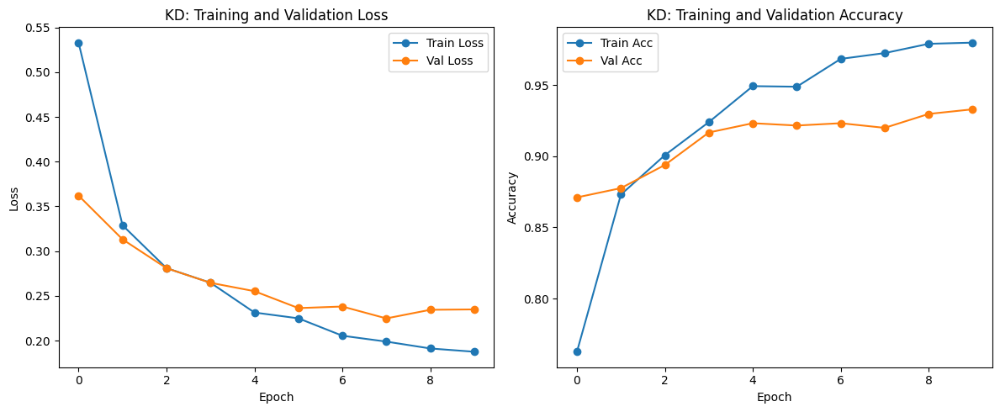

Student model saved to: /content/drive/MyDrive/knowledge_distilled_student.pth

--- Computing Details ---
Device: cuda:0
GPU Name: Tesla T4
Total GPU Memory: 14.74 GB
Allocated GPU Memory: 1.77 GB
Cached GPU Memory: 4.01 GB


In [ ]:
import os
import glob
import numpy as np
import h5py
from PIL import Image
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from torchvision import models

# --------------------------
# Mount Drive (for Colab)
# --------------------------
from google.colab import drive
drive.mount('/content/drive')

# --------------------------
# Device and GPU Information
# --------------------------
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)
if device.type == "cuda":
    gpu_props = torch.cuda.get_device_properties(0)
    print("GPU Name:", torch.cuda.get_device_name(0))
    print("Total GPU Memory: {:.2f} GB".format(gpu_props.total_memory / (1024**3)))

# --------------------------
# Function to Load MATLAB Files using h5py
# --------------------------
def load_matlab_file(file_path):
    """
    Load a MATLAB file saved in v7.3 format using h5py.
    Checks for a 'cjdata' group and returns its fields.
    """
    with h5py.File(file_path, 'r') as f:
        if "cjdata" in f:
            group = f["cjdata"]
            label = group["label"][()]
            image = group["image"][()]
            tumorBorder = group["tumorBorder"][()] if "tumorBorder" in group else None
            tumorMask = group["tumorMask"][()] if "tumorMask" in group else None
            PID = group["PID"][()] if "PID" in group else None
            return {"label": label, "image": image, "tumorBorder": tumorBorder, "tumorMask": tumorMask, "PID": PID}
        else:
            data = {k: f[k][()] for k in f.keys()}
            return data

# --------------------------
# Custom Dataset Definition
# --------------------------
class BrainTumorDataset(Dataset):
    def __init__(self, file_list, transform=None):
        self.file_list = file_list
        self.transform = transform

    def __len__(self):
        return len(self.file_list)

    def __getitem__(self, idx):
        file_path = self.file_list[idx]
        data = load_matlab_file(file_path)

        if "label" not in data:
            raise KeyError(f"'label' not found in file: {file_path}")
        label = int(np.squeeze(data["label"]))

        if "image" not in data:
            raise KeyError(f"'image' not found in file: {file_path}")
        image = data["image"]
        # Convert grayscale images to 3 channels if needed.
        if image.ndim == 2:
            image = np.stack([image] * 3, axis=-1)
        # Convert to uint8 if necessary.
        if image.dtype != np.uint8:
            image = (255 * (image - np.min(image)) / (np.ptp(image) + 1e-8)).astype(np.uint8)

        image = Image.fromarray(image)
        if self.transform:
            image = self.transform(image)
        # Adjust label from MATLAB 1-indexed to 0-indexed.
        return image, label - 1

# --------------------------
# Data Transforms & Preprocessing
# --------------------------
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ]),
}

# --------------------------
# Prepare Dataset and DataLoaders
# --------------------------
dataset_dir = "/root/.cache/kagglehub/datasets/ashkhagan/figshare-brain-tumor-dataset/versions/1"
all_files = glob.glob(os.path.join(dataset_dir, '**', '*.mat'), recursive=True)
# Filter out non-image files (e.g., cvind.mat)
all_files = [f for f in all_files if "cvind" not in os.path.basename(f).lower()]
print("Total .mat data files found:", len(all_files))

np.random.shuffle(all_files)
split_idx = int(0.8 * len(all_files))
train_files = all_files[:split_idx]
val_files = all_files[split_idx:]
print("Train files:", len(train_files), "Validation files:", len(val_files))

train_dataset = BrainTumorDataset(train_files, transform=data_transforms['train'])
val_dataset = BrainTumorDataset(val_files, transform=data_transforms['val'])

batch_size = 16
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

# --------------------------
# Define the Teacher Model (Hybrid: VGG19 + ViT)
# --------------------------
class HybridModel(nn.Module):
    def __init__(self, num_classes, use_pretrained=True, feature_extract=True):
        super(HybridModel, self).__init__()

        # VGG19 with batch normalization
        self.vgg = models.vgg19_bn(pretrained=use_pretrained)
        if feature_extract:
            for param in self.vgg.parameters():
                param.requires_grad = False
        num_ftrs_vgg = self.vgg.classifier[6].in_features
        self.vgg.classifier[6] = nn.Linear(num_ftrs_vgg, num_classes)

        # Vision Transformer (ViT-B-16)
        self.vit = models.vit_b_16(pretrained=use_pretrained)
        if feature_extract:
            for param in self.vit.parameters():
                param.requires_grad = False
        num_ftrs_vit = self.vit.heads.head.in_features
        self.vit.heads.head = nn.Linear(num_ftrs_vit, num_classes)

        # Combined classifier that fuses outputs from VGG and ViT
        self.classifier = nn.Linear(num_classes * 2, num_classes)

    def forward(self, x):
        vgg_out = self.vgg(x)
        vit_out = self.vit(x)
        combined_out = torch.cat((vgg_out, vit_out), dim=1)
        output = self.classifier(combined_out)
        return output

def initialize_teacher(num_classes, feature_extract=True, use_pretrained=True):
    model = HybridModel(num_classes, use_pretrained, feature_extract)
    return model

num_classes = 3  # Three tumor types
teacher_model = initialize_teacher(num_classes, feature_extract=True, use_pretrained=True)
teacher_model = teacher_model.to(device)

# --------------------------
# Load the Trained Teacher Model
# --------------------------
teacher_save_path = "/content/drive/MyDrive/Tumour_teacher.pth"
teacher_model.load_state_dict(torch.load(teacher_save_path, map_location=device))
teacher_model.eval()  # Freeze teacher model
for param in teacher_model.parameters():
    param.requires_grad = False
print("Loaded teacher model from:", teacher_save_path)

# --------------------------
# Define the Student Model (EfficientNet-B0)
# --------------------------
student_model = models.efficientnet_b0(pretrained=True)
# Replace the classifier for 3 classes.
in_features = student_model.classifier[1].in_features
student_model.classifier[1] = nn.Linear(in_features, num_classes)
student_model = student_model.to(device)
print("Student model (EfficientNet-B0) defined.")

# --------------------------
# Define the Knowledge Distillation Loss Function
# --------------------------
def distillation_loss(student_logits, teacher_logits, labels, T, alpha):
    """
    Computes the distillation loss:
      - Hard loss: standard cross entropy with true labels.
      - Soft loss: KL divergence between teacher and student logits (with temperature scaling).
    """
    hard_loss = F.cross_entropy(student_logits, labels)
    # Soften logits
    student_log_probs = F.log_softmax(student_logits / T, dim=1)
    teacher_probs = F.softmax(teacher_logits / T, dim=1)
    soft_loss = F.kl_div(student_log_probs, teacher_probs, reduction='batchmean')
    return alpha * hard_loss + (1 - alpha) * (T * T) * soft_loss

# --------------------------
# Optimizer for the Student Model
# --------------------------
optimizer = optim.Adam(student_model.parameters(), lr=1e-4)

# --------------------------
# Knowledge Distillation Training Loop
# --------------------------
num_epochs = 10
temperature = 4.0
alpha = 0.7

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []

for epoch in range(num_epochs):
    print(f"\nEpoch {epoch+1}/{num_epochs}")

    # Training phase
    student_model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for inputs, labels in train_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        # Get teacher predictions (no grad)
        with torch.no_grad():
            teacher_logits = teacher_model(inputs)

        optimizer.zero_grad()
        student_logits = student_model(inputs)

        loss = distillation_loss(student_logits, teacher_logits, labels, temperature, alpha)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * inputs.size(0)
        _, preds = torch.max(student_logits, 1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total
    train_losses.append(epoch_loss)
    train_accuracies.append(epoch_acc)
    print(f"Train Loss: {epoch_loss:.4f}, Train Acc: {epoch_acc:.4f}")

    # Validation phase (using only ground truth labels)
    student_model.eval()
    running_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            student_logits = student_model(inputs)
            loss = F.cross_entropy(student_logits, labels)
            running_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(student_logits, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total
    val_losses.append(epoch_loss)
    val_accuracies.append(epoch_acc)
    print(f"Val Loss: {epoch_loss:.4f}, Val Acc: {epoch_acc:.4f}")

# --------------------------
# Visualization of Training Curves
# --------------------------
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label="Train Loss", marker="o")
plt.plot(val_losses, label="Val Loss", marker="o")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("KD: Training and Validation Loss")
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label="Train Acc", marker="o")
plt.plot(val_accuracies, label="Val Acc", marker="o")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("KD: Training and Validation Accuracy")
plt.legend()

plt.tight_layout()
plt.show()

# --------------------------
# Save the Trained Student Model
# --------------------------
student_save_path = "/content/drive/MyDrive/knowledge_distilled_student.pth"
torch.save(student_model.state_dict(), student_save_path)
print("Student model saved to:", student_save_path)

# --------------------------
# Log Additional Computing Details
# --------------------------
print("\n--- Computing Details ---")
print("Device:", device)
if device.type == "cuda":
    print("GPU Name:", torch.cuda.get_device_name(0))
    print("Total GPU Memory: {:.2f} GB".format(torch.cuda.get_device_properties(0).total_memory / (1024**3)))
    print("Allocated GPU Memory: {:.2f} GB".format(torch.cuda.memory_allocated(0) / (1024**3)))
    print("Cached GPU Memory: {:.2f} GB".format(torch.cuda.memory_reserved(0) / (1024**3)))


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using device: cuda:0


<ipython-input-11-1eaa8148a24c>:58: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  teacher_model.load_state_dict(torch.load(teacher_path, map_location=device))


Loaded Teacher Model from: /content/drive/MyDrive/Tumour_teacher.pth


<ipython-input-11-1eaa8148a24c>:70: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  student_model.load_state_dict(torch.load(student_path, map_location=device))


Loaded Student Model from: /content/drive/MyDrive/knowledge_distilled_student.pth
Teacher Model - Inference Time: 311.16 ms, Peak Memory: 3111.05 MB
Student Model - Inference Time: 23.05 ms, Peak Memory: 1995.73 MB


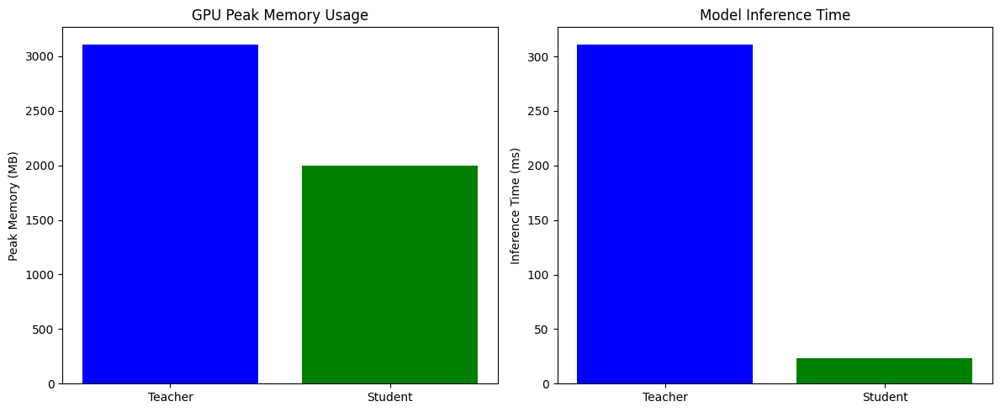

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
import matplotlib.pyplot as plt

# --------------------------
# Mount Google Drive (if not already mounted)
# --------------------------
from google.colab import drive
drive.mount('/content/drive')

# --------------------------
# Device Setup
# --------------------------
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# --------------------------
# Define the Teacher Model (Hybrid: VGG19 + ViT)
# --------------------------
class HybridModel(nn.Module):
    def __init__(self, num_classes, use_pretrained=True, feature_extract=True):
        super(HybridModel, self).__init__()

        # VGG19 with batch normalization
        self.vgg = models.vgg19_bn(pretrained=use_pretrained)
        if feature_extract:
            for param in self.vgg.parameters():
                param.requires_grad = False
        num_ftrs_vgg = self.vgg.classifier[6].in_features
        self.vgg.classifier[6] = nn.Linear(num_ftrs_vgg, num_classes)

        # Vision Transformer (ViT-B-16)
        self.vit = models.vit_b_16(pretrained=use_pretrained)
        if feature_extract:
            for param in self.vit.parameters():
                param.requires_grad = False
        num_ftrs_vit = self.vit.heads.head.in_features
        self.vit.heads.head = nn.Linear(num_ftrs_vit, num_classes)

        # Combined classifier to fuse outputs from VGG and ViT
        self.classifier = nn.Linear(num_classes * 2, num_classes)

    def forward(self, x):
        vgg_out = self.vgg(x)
        vit_out = self.vit(x)
        combined_out = torch.cat((vgg_out, vit_out), dim=1)
        output = self.classifier(combined_out)
        return output

# --------------------------
# Load the Trained Teacher Model
# --------------------------
num_classes = 3  # Adjust if needed
teacher_model = HybridModel(num_classes, use_pretrained=True, feature_extract=True)
teacher_path = "/content/drive/MyDrive/Tumour_teacher.pth"
teacher_model.load_state_dict(torch.load(teacher_path, map_location=device))
teacher_model = teacher_model.to(device)
teacher_model.eval()
print("Loaded Teacher Model from:", teacher_path)

# --------------------------
# Define the Student Model (EfficientNet-B0)
# --------------------------
student_model = models.efficientnet_b0(pretrained=True)
in_features = student_model.classifier[1].in_features
student_model.classifier[1] = nn.Linear(in_features, num_classes)
student_path = "/content/drive/MyDrive/knowledge_distilled_student.pth"
student_model.load_state_dict(torch.load(student_path, map_location=device))
student_model = student_model.to(device)
student_model.eval()
print("Loaded Student Model from:", student_path)

# --------------------------
# Function to Measure Inference Time and Peak GPU Memory Usage
# --------------------------
def measure_model_performance(model, input_tensor, device):
    # Reset the peak memory stats for a clean measurement
    torch.cuda.reset_peak_memory_stats(device)

    # Set up CUDA events to measure time (in milliseconds)
    start_event = torch.cuda.Event(enable_timing=True)
    end_event = torch.cuda.Event(enable_timing=True)

    model.eval()
    with torch.no_grad():
        start_event.record()
        _ = model(input_tensor)
        end_event.record()
        torch.cuda.synchronize()

    # Compute elapsed time (ms)
    elapsed_time = start_event.elapsed_time(end_event)

    # Peak memory allocated (in MB)
    peak_memory = torch.cuda.max_memory_allocated(device) / (1024 ** 2)
    return elapsed_time, peak_memory

# --------------------------
# Create a Dummy Input for Inference (batch size 16, 3x224x224)
# --------------------------
batch_size = 16
dummy_input = torch.randn(batch_size, 3, 224, 224).to(device)

# --------------------------
# Measure Performance for the Teacher Model
# --------------------------
teacher_time, teacher_memory = measure_model_performance(teacher_model, dummy_input, device)
print(f"Teacher Model - Inference Time: {teacher_time:.2f} ms, Peak Memory: {teacher_memory:.2f} MB")

# --------------------------
# Measure Performance for the Student Model
# --------------------------
student_time, student_memory = measure_model_performance(student_model, dummy_input, device)
print(f"Student Model - Inference Time: {student_time:.2f} ms, Peak Memory: {student_memory:.2f} MB")

# --------------------------
# Visualize the Results
# --------------------------
models_names = ['Teacher', 'Student']
memory_usage = [teacher_memory, student_memory]
inference_times = [teacher_time, student_time]

fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Plot for GPU Peak Memory Usage
axs[0].bar(models_names, memory_usage, color=['blue', 'green'])
axs[0].set_ylabel('Peak Memory (MB)')
axs[0].set_title('GPU Peak Memory Usage')

# Plot for Inference Time
axs[1].bar(models_names, inference_times, color=['blue', 'green'])
axs[1].set_ylabel('Inference Time (ms)')
axs[1].set_title('Model Inference Time')

plt.tight_layout()
plt.show()


experiment part - 2

Using device: cuda:0
GPU Name: Tesla T4
Total .mat data files found: 3064
Train files: 2451 Validation files: 613


/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weight

EfficientNet-B0 model:
EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
         

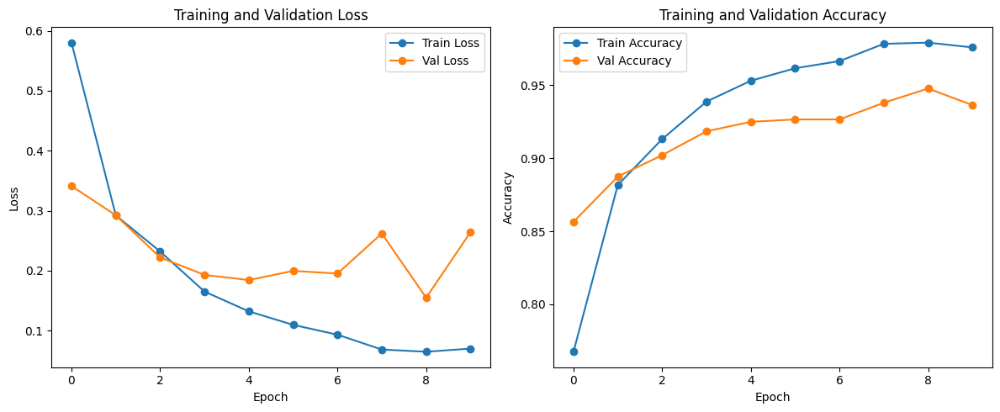

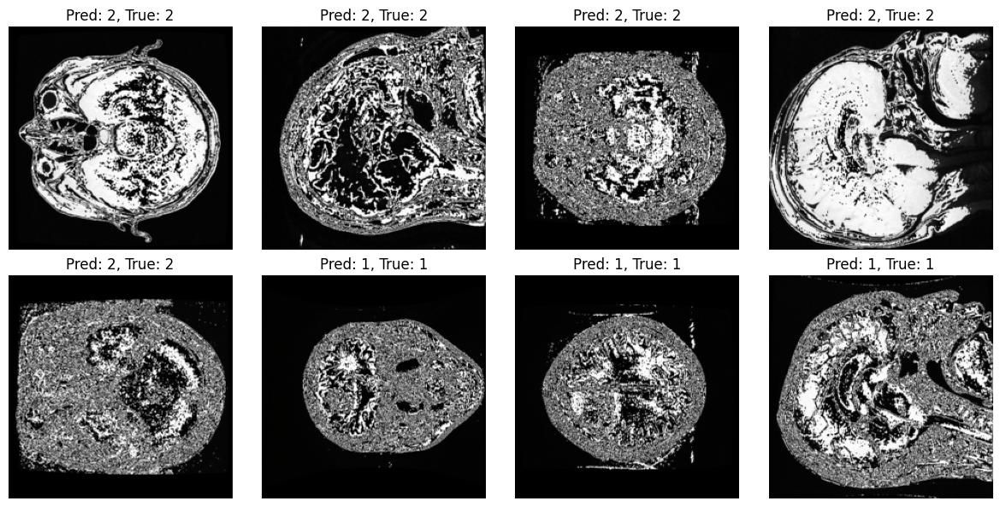

Mounted at /content/drive
Trained EfficientNet-B0 model saved to: /content/drive/MyDrive/efficientnet_trained.pth

--- Computing Details ---
Device: cuda:0
GPU Name: Tesla T4
Total GPU Memory: 14.74 GB
Allocated GPU Memory: 0.75 GB
Cached GPU Memory: 1.60 GB


In [ ]:
import os
import glob
import numpy as np
import h5py
from PIL import Image
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from torchvision import models

# --------------------------
# Device Configuration
# --------------------------
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)
if device.type == "cuda":
    print("GPU Name:", torch.cuda.get_device_name(0))

# --------------------------
# Function to Load MATLAB Files
# --------------------------
def load_matlab_file(file_path):
    """
    Load a MATLAB file saved in v7.3 format using h5py.
    Checks for a 'cjdata' group and returns its fields.
    """
    with h5py.File(file_path, 'r') as f:
        if "cjdata" in f:
            group = f["cjdata"]
            label = group["label"][()]
            image = group["image"][()]
            return {"label": label, "image": image}
        else:
            data = {k: f[k][()] for k in f.keys()}
            return data

# --------------------------
# Custom Dataset Definition
# --------------------------
class BrainTumorDataset(Dataset):
    def __init__(self, file_list, transform=None):
        self.file_list = file_list
        self.transform = transform

    def __len__(self):
        return len(self.file_list)

    def __getitem__(self, idx):
        file_path = self.file_list[idx]
        data = load_matlab_file(file_path)

        if "label" not in data:
            raise KeyError(f"'label' not found in file: {file_path}")
        label = int(np.squeeze(data["label"]))

        if "image" not in data:
            raise KeyError(f"'image' not found in file: {file_path}")
        image = data["image"]
        # If the image is grayscale, convert it to 3 channels.
        if image.ndim == 2:
            image = np.stack([image] * 3, axis=-1)
        # Normalize image to uint8 if needed.
        if image.dtype != np.uint8:
            image = (255 * (image - np.min(image)) / (np.ptp(image) + 1e-8)).astype(np.uint8)

        image = Image.fromarray(image)
        if self.transform:
            image = self.transform(image)
        # Adjust label from MATLAB's 1-indexed to 0-indexed.
        return image, label - 1

# --------------------------
# Data Transforms & Preprocessing
# --------------------------
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ]),
}

# --------------------------
# Prepare Dataset and DataLoaders
# --------------------------
# Set the path to your dataset directory
dataset_dir = "/root/.cache/kagglehub/datasets/ashkhagan/figshare-brain-tumor-dataset/versions/1"

# Get all .mat files recursively, excluding files like "cvind.mat"
all_files = glob.glob(os.path.join(dataset_dir, '**', '*.mat'), recursive=True)
all_files = [f for f in all_files if "cvind" not in os.path.basename(f).lower()]
print("Total .mat data files found:", len(all_files))

# Shuffle and split data (80% train, 20% val)
np.random.shuffle(all_files)
split_idx = int(0.8 * len(all_files))
train_files = all_files[:split_idx]
val_files = all_files[split_idx:]
print("Train files:", len(train_files), "Validation files:", len(val_files))

train_dataset = BrainTumorDataset(train_files, transform=data_transforms['train'])
val_dataset = BrainTumorDataset(val_files, transform=data_transforms['val'])

batch_size = 16
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

# --------------------------
# Define EfficientNet-B0 Model for Classification
# --------------------------
num_classes = 3  # Three tumor types (e.g., meningioma, glioma, pituitary)
model = models.efficientnet_b0(pretrained=True)
# Replace the classifier for our number of classes.
in_features = model.classifier[1].in_features
model.classifier[1] = nn.Linear(in_features, num_classes)
model = model.to(device)
print("EfficientNet-B0 model:")
print(model)

# --------------------------
# Loss Function and Optimizer
# --------------------------
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)

# --------------------------
# Training and Validation Loop
# --------------------------
num_epochs = 10
train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []

for epoch in range(num_epochs):
    print(f"\nEpoch {epoch+1}/{num_epochs}")

    # Training Phase
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    for inputs, labels in train_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * inputs.size(0)
        _, preds = torch.max(outputs, 1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total
    train_losses.append(epoch_loss)
    train_accuracies.append(epoch_acc)
    print(f"Train Loss: {epoch_loss:.4f}, Train Acc: {epoch_acc:.4f}")

    # Validation Phase
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            running_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total
    val_losses.append(epoch_loss)
    val_accuracies.append(epoch_acc)
    print(f"Val Loss: {epoch_loss:.4f}, Val Acc: {epoch_acc:.4f}")

# --------------------------
# Visualization of Training Curves
# --------------------------
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(train_losses, label="Train Loss", marker="o")
plt.plot(val_losses, label="Val Loss", marker="o")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label="Train Accuracy", marker="o")
plt.plot(val_accuracies, label="Val Accuracy", marker="o")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuracy")
plt.legend()

plt.tight_layout()
plt.show()

# --------------------------
# Visualize Sample Predictions
# --------------------------
model.eval()
sample_loader = DataLoader(val_dataset, batch_size=8, shuffle=True)
inputs, labels = next(iter(sample_loader))
inputs = inputs.to(device)
outputs = model(inputs)
_, preds = torch.max(outputs, 1)
inputs = inputs.cpu()

# Define inverse normalization to bring images back to [0,1] for display.
inv_normalize = transforms.Normalize(
    mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
    std=[1/0.229, 1/0.224, 1/0.225]
)

fig, axes = plt.subplots(2, 4, figsize=(12, 6))
axes = axes.flatten()
for img, pred, true, ax in zip(inputs, preds, labels, axes):
    img = inv_normalize(img)
    img = torch.clamp(img, 0, 1)
    ax.imshow(img.permute(1, 2, 0))
    ax.set_title(f"Pred: {pred.item()}, True: {true.item()}")
    ax.axis("off")
plt.tight_layout()
plt.show()

# --------------------------
# Mount Google Drive and Save the Trained Model
# --------------------------
from google.colab import drive
drive.mount('/content/drive')

model_save_path = "/content/drive/MyDrive/efficientnet_trained.pth"
torch.save(model.state_dict(), model_save_path)
print("Trained EfficientNet-B0 model saved to:", model_save_path)

# --------------------------
# Log Additional Computing Details
# --------------------------
print("\n--- Computing Details ---")
print("Device:", device)
if device.type == "cuda":
    print("GPU Name:", torch.cuda.get_device_name(0))
    print("Total GPU Memory: {:.2f} GB".format(torch.cuda.get_device_properties(0).total_memory / (1024**3)))
    print("Allocated GPU Memory: {:.2f} GB".format(torch.cuda.memory_allocated(0) / (1024**3)))
    print("Cached GPU Memory: {:.2f} GB".format(torch.cuda.memory_reserved(0) / (1024**3)))


Path to dataset files: /root/.cache/kagglehub/datasets/ashkhagan/figshare-brain-tumor-dataset/versions/1
Using device: cuda:0
GPU Name: Tesla T4
Total GPU Memory: 14.74 GB
Total .mat data files found: 3064
Train files: 2451 Validation files: 613


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_BN_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_BN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19_bn-c79401a0.pth" to /root/.cache/torch/hub/checkpoints/vgg19_bn-c79401a0.pth
100%|██████████| 548M/548M [00:08<00:00, 66.3MB/s]


Hybrid VGG Teacher Model Architecture:
HybridVGGTeacher(
  (vgg1): VGG(
    (features): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
      (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (9): ReLU(inplace=True)
      (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (12): ReLU(inplace=True)
      (13): Max

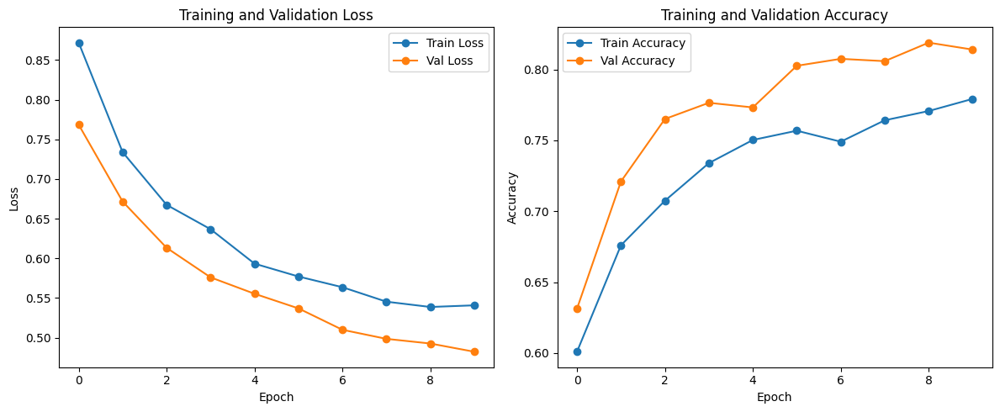

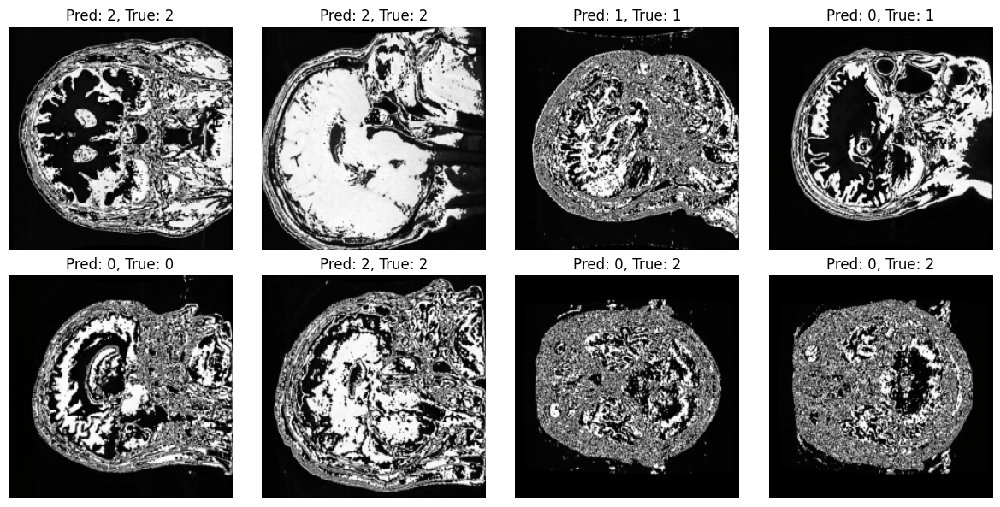


--- Computing Details ---
Device: cuda:0
GPU Name: Tesla T4
Total GPU Memory: 14.74 GB
Allocated GPU Memory: 1.09 GB
Cached GPU Memory: 4.96 GB

Model saved to /content/drive/MyDrive/new_teacher_vgg_model.pth


In [ ]:
import kagglehub

# Download latest version of the dataset
path = kagglehub.dataset_download("ashkhagan/figshare-brain-tumor-dataset")
print("Path to dataset files:", path)

import os
import glob
import numpy as np
import h5py
from PIL import Image
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from torchvision import models

# --------------------------
# Device and GPU Information
# --------------------------
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)
if device.type == "cuda":
    gpu_props = torch.cuda.get_device_properties(0)
    print("GPU Name:", torch.cuda.get_device_name(0))
    print("Total GPU Memory: {:.2f} GB".format(gpu_props.total_memory / (1024**3)))

# --------------------------
# Function to Load MATLAB Files using h5py
# --------------------------
def load_matlab_file(file_path):
    """
    Load a MATLAB file saved in v7.3 format using h5py.
    This function first checks for a 'cjdata' group and returns its fields.
    If not found, it loads keys from the top level.
    """
    with h5py.File(file_path, 'r') as f:
        if "cjdata" in f:
            group = f["cjdata"]
            label = group["label"][()]
            image = group["image"][()]
            tumorBorder = group["tumorBorder"][()] if "tumorBorder" in group else None
            tumorMask = group["tumorMask"][()] if "tumorMask" in group else None
            PID = group["PID"][()] if "PID" in group else None
            return {"label": label, "image": image, "tumorBorder": tumorBorder, "tumorMask": tumorMask, "PID": PID}
        else:
            # Fallback: return all keys in the file
            data = {k: f[k][()] for k in f.keys()}
            return data

# --------------------------
# Custom Dataset Definition
# --------------------------
class BrainTumorDataset(Dataset):
    def __init__(self, file_list, transform=None):
        self.file_list = file_list
        self.transform = transform

    def __len__(self):
        return len(self.file_list)

    def __getitem__(self, idx):
        file_path = self.file_list[idx]
        data = load_matlab_file(file_path)

        if "label" not in data:
            raise KeyError(f"'label' not found in file: {file_path}")
        label = data["label"]
        # Squeeze dimensions in case label is stored as an array (e.g., shape (1,1))
        label = int(np.squeeze(label))

        if "image" not in data:
            raise KeyError(f"'image' not found in file: {file_path}")
        image = data["image"]
        # If grayscale, convert to 3 channels.
        if image.ndim == 2:
            image = np.stack([image] * 3, axis=-1)
        # Normalize image to uint8 if necessary.
        if image.dtype != np.uint8:
            image = (255 * (image - np.min(image)) / (np.ptp(image) + 1e-8)).astype(np.uint8)

        image = Image.fromarray(image)
        if self.transform:
            image = self.transform(image)
        # Adjust label from 1-indexed (MATLAB) to 0-indexed.
        return image, label - 1

# --------------------------
# Data Transforms & Preprocessing
# --------------------------
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ]),
}

# --------------------------
# Prepare Dataset and DataLoaders
# --------------------------
# Path to the dataset directory (adjust the path if necessary)
dataset_dir = "/root/.cache/kagglehub/datasets/ashkhagan/figshare-brain-tumor-dataset/versions/1"
# Get all .mat files recursively but filter out files like "cvind.mat"
all_files = glob.glob(os.path.join(dataset_dir, '**', '*.mat'), recursive=True)
all_files = [f for f in all_files if "cvind" not in os.path.basename(f).lower()]
print("Total .mat data files found:", len(all_files))

# Shuffle and split into training (80%) and validation (20%) sets.
np.random.shuffle(all_files)
split_idx = int(0.8 * len(all_files))
train_files = all_files[:split_idx]
val_files = all_files[split_idx:]
print("Train files:", len(train_files), "Validation files:", len(val_files))

train_dataset = BrainTumorDataset(train_files, transform=data_transforms['train'])
val_dataset = BrainTumorDataset(val_files, transform=data_transforms['val'])

batch_size = 16
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

# --------------------------
# Define the New Teacher Model with Two VGG19 Branches
# --------------------------
class HybridVGGTeacher(nn.Module):
    def __init__(self, num_classes, use_pretrained=True, feature_extract=True):
        super(HybridVGGTeacher, self).__init__()
        # Branch 1: VGG19 with BatchNorm
        self.vgg1 = models.vgg19_bn(pretrained=use_pretrained)
        if feature_extract:
            for param in self.vgg1.parameters():
                param.requires_grad = False
        num_ftrs1 = self.vgg1.classifier[6].in_features
        self.vgg1.classifier[6] = nn.Linear(num_ftrs1, num_classes)

        # Branch 2: Another VGG19 with BatchNorm
        self.vgg2 = models.vgg19_bn(pretrained=use_pretrained)
        if feature_extract:
            for param in self.vgg2.parameters():
                param.requires_grad = False
        num_ftrs2 = self.vgg2.classifier[6].in_features
        self.vgg2.classifier[6] = nn.Linear(num_ftrs2, num_classes)

        # Combined classifier: takes concatenated outputs from both VGG branches
        self.classifier = nn.Linear(num_classes * 2, num_classes)

    def forward(self, x):
        out1 = self.vgg1(x)
        out2 = self.vgg2(x)
        combined = torch.cat((out1, out2), dim=1)
        output = self.classifier(combined)
        return output

def initialize_teacher_model(num_classes, feature_extract=True, use_pretrained=True):
    model = HybridVGGTeacher(num_classes, use_pretrained, feature_extract)
    input_size = 224
    return model, input_size

num_classes = 3  # Three tumor types: meningioma, glioma, pituitary tumor
model_ft, input_size = initialize_teacher_model(num_classes, feature_extract=True, use_pretrained=True)
model_ft = model_ft.to(device)

# Print model summary (for documentation)
print("Hybrid VGG Teacher Model Architecture:")
print(model_ft)

# --------------------------
# Define Loss Function and Optimizer
# --------------------------
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model_ft.parameters()), lr=1e-4)

# --------------------------
# Training and Validation Loop
# --------------------------
num_epochs = 10
train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []

for epoch in range(num_epochs):
    print(f"\nEpoch {epoch+1}/{num_epochs}")

    # Training Phase
    model_ft.train()
    running_loss = 0.0
    correct = 0
    total = 0
    for inputs, labels in train_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = model_ft(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * inputs.size(0)
        _, preds = torch.max(outputs, 1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total
    train_losses.append(epoch_loss)
    train_accuracies.append(epoch_acc)
    print(f"Train Loss: {epoch_loss:.4f}, Train Acc: {epoch_acc:.4f}")

    # Validation Phase
    model_ft.eval()
    running_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model_ft(inputs)
            loss = criterion(outputs, labels)
            running_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total
    val_losses.append(epoch_loss)
    val_accuracies.append(epoch_acc)
    print(f"Val Loss: {epoch_loss:.4f}, Val Acc: {epoch_acc:.4f}")

# --------------------------
# Visualization of Training Curves
# --------------------------
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label="Train Loss", marker="o")
plt.plot(val_losses, label="Val Loss", marker="o")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label="Train Accuracy", marker="o")
plt.plot(val_accuracies, label="Val Accuracy", marker="o")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuracy")
plt.legend()

plt.tight_layout()
plt.show()

# --------------------------
# Visualize Sample Predictions
# --------------------------
model_ft.eval()
sample_loader = DataLoader(val_dataset, batch_size=8, shuffle=True)
inputs, labels = next(iter(sample_loader))
inputs = inputs.to(device)
outputs = model_ft(inputs)
_, preds = torch.max(outputs, 1)
inputs = inputs.cpu()

# Inverse normalization for visualization
inv_normalize = transforms.Normalize(
    mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
    std=[1/0.229, 1/0.224, 1/0.225]
)

fig, axes = plt.subplots(2, 4, figsize=(12, 6))
axes = axes.flatten()
for img, pred, true, ax in zip(inputs, preds, labels, axes):
    img = inv_normalize(img)
    img = torch.clamp(img, 0, 1)
    ax.imshow(img.permute(1, 2, 0))
    ax.set_title(f"Pred: {pred.item()}, True: {true.item()}")
    ax.axis("off")
plt.tight_layout()
plt.show()

# --------------------------
# Log Additional Computing Details
# --------------------------
print("\n--- Computing Details ---")
print("Device:", device)
if device.type == "cuda":
    print("GPU Name:", torch.cuda.get_device_name(0))
    print("Total GPU Memory: {:.2f} GB".format(torch.cuda.get_device_properties(0).total_memory / (1024**3)))
    print("Allocated GPU Memory: {:.2f} GB".format(torch.cuda.memory_allocated(0) / (1024**3)))
    print("Cached GPU Memory: {:.2f} GB".format(torch.cuda.memory_reserved(0) / (1024**3)))

# --------------------------
# Save the Trained Model to Drive
# --------------------------
# Adjust the save path as needed (example path for Google Colab)
save_path = "/content/drive/MyDrive/new_teacher_vgg_model.pth"
torch.save(model_ft.state_dict(), save_path)
print(f"\nModel saved to {save_path}")



Path to dataset files: /root/.cache/kagglehub/datasets/ashkhagan/figshare-brain-tumor-dataset/versions/1
Using device: cuda:0
GPU Name: Tesla T4
Total GPU Memory: 14.74 GB
Total .mat data files found: 3064
Train files: 2451 Validation files: 613


/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_BN_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19

Teacher model loaded from /content/drive/MyDrive/new_teacher_vgg_model.pth
Student model (EfficientNet-B0) initialized.

Epoch 1/10


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Train Loss: 0.4785, Train Acc: 0.7748
Val Loss: 0.3011, Val Acc: 0.8760

Epoch 2/10
Train Loss: 0.3222, Train Acc: 0.8629
Val Loss: 0.2945, Val Acc: 0.8793

Epoch 3/10
Train Loss: 0.2925, Train Acc: 0.8915
Val Loss: 0.2825, Val Acc: 0.8972

Epoch 4/10
Train Loss: 0.2731, Train Acc: 0.9041
Val Loss: 0.2623, Val Acc: 0.9021

Epoch 5/10
Train Loss: 0.2493, Train Acc: 0.9294
Val Loss: 0.2577, Val Acc: 0.9184

Epoch 6/10
Train Loss: 0.2448, Train Acc: 0.9225
Val Loss: 0.2592, Val Acc: 0.9233

Epoch 7/10
Train Loss: 0.2282, Train Acc: 0.9408
Val Loss: 0.2545, Val Acc: 0.9217

Epoch 8/10
Train Loss: 0.2206, Train Acc: 0.9519
Val Loss: 0.2573, Val Acc: 0.9135

Epoch 9/10
Train Loss: 0.2154, Train Acc: 0.9535
Val Loss: 0.2454, Val Acc: 0.9282

Epoch 10/10
Train Loss: 0.2076, Train Acc: 0.9665
Val Loss: 0.2524, Val Acc: 0.9217


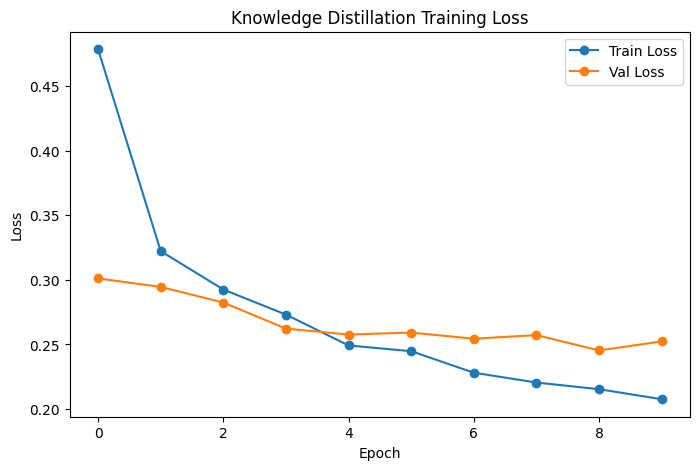


Student model saved to /content/drive/MyDrive/twovgg19student_efficientnet.pth


In [ ]:
import kagglehub

# Download latest version of the dataset
path = kagglehub.dataset_download("ashkhagan/figshare-brain-tumor-dataset")
print("Path to dataset files:", path)

import os
import glob
import numpy as np
import h5py
from PIL import Image
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from torchvision import models

# --------------------------
# Device and GPU Information
# --------------------------
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)
if device.type == "cuda":
    gpu_props = torch.cuda.get_device_properties(0)
    print("GPU Name:", torch.cuda.get_device_name(0))
    print("Total GPU Memory: {:.2f} GB".format(gpu_props.total_memory / (1024**3)))

# --------------------------
# Function to Load MATLAB Files using h5py
# --------------------------
def load_matlab_file(file_path):
    """
    Load a MATLAB file saved in v7.3 format using h5py.
    This function first checks for a 'cjdata' group and returns its fields.
    If not found, it loads keys from the top level.
    """
    with h5py.File(file_path, 'r') as f:
        if "cjdata" in f:
            group = f["cjdata"]
            label = group["label"][()]
            image = group["image"][()]
            tumorBorder = group["tumorBorder"][()] if "tumorBorder" in group else None
            tumorMask = group["tumorMask"][()] if "tumorMask" in group else None
            PID = group["PID"][()] if "PID" in group else None
            return {"label": label, "image": image, "tumorBorder": tumorBorder, "tumorMask": tumorMask, "PID": PID}
        else:
            data = {k: f[k][()] for k in f.keys()}
            return data

# --------------------------
# Custom Dataset Definition
# --------------------------
class BrainTumorDataset(Dataset):
    def __init__(self, file_list, transform=None):
        self.file_list = file_list
        self.transform = transform

    def __len__(self):
        return len(self.file_list)

    def __getitem__(self, idx):
        file_path = self.file_list[idx]
        data = load_matlab_file(file_path)

        if "label" not in data:
            raise KeyError(f"'label' not found in file: {file_path}")
        label = int(np.squeeze(data["label"]))

        if "image" not in data:
            raise KeyError(f"'image' not found in file: {file_path}")
        image = data["image"]
        # Convert grayscale to 3 channels if needed.
        if image.ndim == 2:
            image = np.stack([image] * 3, axis=-1)
        # Normalize image to uint8 if necessary.
        if image.dtype != np.uint8:
            image = (255 * (image - np.min(image)) / (np.ptp(image) + 1e-8)).astype(np.uint8)

        image = Image.fromarray(image)
        if self.transform:
            image = self.transform(image)
        # Adjust label from 1-indexed (MATLAB) to 0-indexed.
        return image, label - 1

# --------------------------
# Data Transforms & Preprocessing
# --------------------------
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ]),
}

# --------------------------
# Prepare Dataset and DataLoaders
# --------------------------
dataset_dir = "/root/.cache/kagglehub/datasets/ashkhagan/figshare-brain-tumor-dataset/versions/1"
all_files = glob.glob(os.path.join(dataset_dir, '**', '*.mat'), recursive=True)
all_files = [f for f in all_files if "cvind" not in os.path.basename(f).lower()]
print("Total .mat data files found:", len(all_files))

np.random.shuffle(all_files)
split_idx = int(0.8 * len(all_files))
train_files = all_files[:split_idx]
val_files = all_files[split_idx:]
print("Train files:", len(train_files), "Validation files:", len(val_files))

train_dataset = BrainTumorDataset(train_files, transform=data_transforms['train'])
val_dataset = BrainTumorDataset(val_files, transform=data_transforms['val'])

batch_size = 16
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

# --------------------------
# Teacher Model: Hybrid VGG19 (using two VGG19 branches)
# --------------------------
class HybridVGGTeacher(nn.Module):
    def __init__(self, num_classes, use_pretrained=True, feature_extract=True):
        super(HybridVGGTeacher, self).__init__()
        # First VGG19 branch
        self.vgg1 = models.vgg19_bn(pretrained=use_pretrained)
        if feature_extract:
            for param in self.vgg1.parameters():
                param.requires_grad = False
        num_ftrs1 = self.vgg1.classifier[6].in_features
        self.vgg1.classifier[6] = nn.Linear(num_ftrs1, num_classes)

        # Second VGG19 branch
        self.vgg2 = models.vgg19_bn(pretrained=use_pretrained)
        if feature_extract:
            for param in self.vgg2.parameters():
                param.requires_grad = False
        num_ftrs2 = self.vgg2.classifier[6].in_features
        self.vgg2.classifier[6] = nn.Linear(num_ftrs2, num_classes)

        # Final classifier for concatenated outputs
        self.classifier = nn.Linear(num_classes * 2, num_classes)

    def forward(self, x):
        out1 = self.vgg1(x)
        out2 = self.vgg2(x)
        combined = torch.cat((out1, out2), dim=1)
        output = self.classifier(combined)
        return output

def initialize_teacher_model(num_classes, feature_extract=True, use_pretrained=True):
    model = HybridVGGTeacher(num_classes, use_pretrained, feature_extract)
    input_size = 224
    return model, input_size

num_classes = 3  # For meningioma, glioma, pituitary tumor
teacher_model, _ = initialize_teacher_model(num_classes, feature_extract=True, use_pretrained=True)
teacher_model = teacher_model.to(device)

# --------------------------
# Load Pre-trained Teacher Model Weights
# --------------------------
teacher_weights_path = "/content/drive/MyDrive/new_teacher_vgg_model.pth"
teacher_model.load_state_dict(torch.load(teacher_weights_path, map_location=device))
teacher_model.eval()
for param in teacher_model.parameters():
    param.requires_grad = False
print("Teacher model loaded from", teacher_weights_path)

# --------------------------
# Student Model: EfficientNet-B0
# --------------------------
student_model = models.efficientnet_b0(pretrained=True)
# Replace the classifier to match the number of classes
in_features = student_model.classifier[1].in_features
student_model.classifier[1] = nn.Linear(in_features, num_classes)
student_model = student_model.to(device)
print("Student model (EfficientNet-B0) initialized.")

# --------------------------
# Define Knowledge Distillation Loss Function
# --------------------------
def distillation_loss(student_logits, teacher_logits, target, T=4.0, alpha=0.5):
    """
    Compute the distillation loss as a weighted sum of:
    - The standard cross-entropy loss with ground truth labels.
    - The KL divergence between the softened student and teacher predictions.
    T: temperature for softening.
    alpha: weight for the ground truth loss.
    """
    ce_loss = F.cross_entropy(student_logits, target)
    p_student = F.log_softmax(student_logits / T, dim=1)
    p_teacher = F.softmax(teacher_logits / T, dim=1)
    kd_loss = F.kl_div(p_student, p_teacher, reduction='batchmean') * (T * T)
    return alpha * ce_loss + (1 - alpha) * kd_loss

# --------------------------
# Define Optimizer for the Student Model
# --------------------------
optimizer = optim.Adam(student_model.parameters(), lr=1e-4)

# --------------------------
# Knowledge Distillation Training Loop
# --------------------------
num_epochs = 10
train_losses, val_losses = [], []

for epoch in range(num_epochs):
    print(f"\nEpoch {epoch+1}/{num_epochs}")
    student_model.train()
    running_loss = 0.0
    total = 0
    correct = 0

    for inputs, labels in train_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        # Obtain teacher predictions (no gradient)
        with torch.no_grad():
            teacher_outputs = teacher_model(inputs)

        # Student predictions
        student_outputs = student_model(inputs)

        loss = distillation_loss(student_outputs, teacher_outputs, labels, T=4.0, alpha=0.5)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * inputs.size(0)
        _, preds = torch.max(student_outputs, 1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total
    train_losses.append(epoch_loss)
    print(f"Train Loss: {epoch_loss:.4f}, Train Acc: {epoch_acc:.4f}")

    # Validation Phase
    student_model.eval()
    running_loss = 0.0
    total = 0
    correct = 0
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            teacher_outputs = teacher_model(inputs)
            student_outputs = student_model(inputs)
            loss = distillation_loss(student_outputs, teacher_outputs, labels, T=4.0, alpha=0.5)

            running_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(student_outputs, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

    val_loss = running_loss / total
    val_acc = correct / total
    val_losses.append(val_loss)
    print(f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")

# --------------------------
# Plot Training and Validation Loss Curves
# --------------------------
plt.figure(figsize=(8,5))
plt.plot(train_losses, label="Train Loss", marker="o")
plt.plot(val_losses, label="Val Loss", marker="o")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Knowledge Distillation Training Loss")
plt.legend()
plt.show()

# --------------------------
# Save the Trained Student Model to Drive
# --------------------------
save_path = "/content/drive/MyDrive/twovgg19student_efficientnet.pth"
torch.save(student_model.state_dict(), save_path)
print(f"\nStudent model saved to {save_path}")


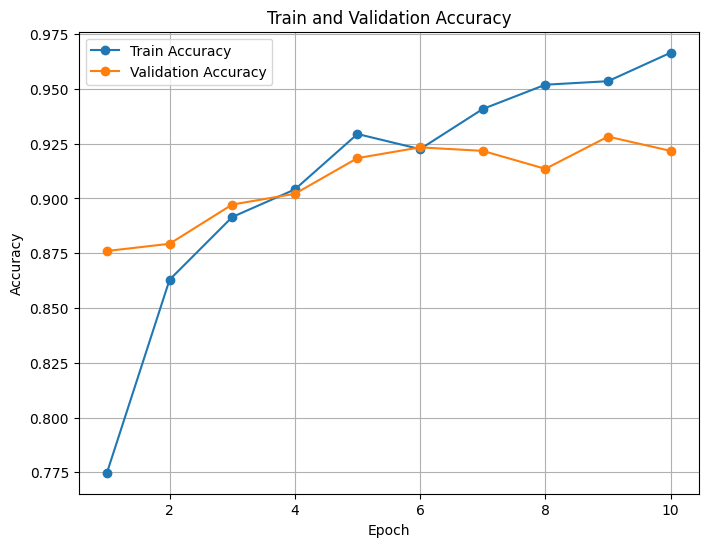

In [ ]:
import matplotlib.pyplot as plt

# Epochs
epochs = list(range(1, 11))

# Accuracy values from your log
train_accuracy = [0.7748, 0.8629, 0.8915, 0.9041, 0.9294, 0.9225, 0.9408, 0.9519, 0.9535, 0.9665]
val_accuracy   = [0.8760, 0.8793, 0.8972, 0.9021, 0.9184, 0.9233, 0.9217, 0.9135, 0.9282, 0.9217]

# Create the plot
plt.figure(figsize=(8, 6))
plt.plot(epochs, train_accuracy, marker='o', label='Train Accuracy')
plt.plot(epochs, val_accuracy, marker='o', label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Train and Validation Accuracy')
plt.legend()
plt.grid(True)
plt.show()


Using device: cuda:0
GPU Name: Tesla T4
Total GPU Memory: 14.74 GB
Total .mat data files found: 3064
Train files: 2451 Validation files: 613


/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ViT_B_16_Weights.IMAGENET1K_V1`. You can also use `weights=ViT_B

Teacher Model Architecture (Two ViTs):
TwoViTHybridModel(
  (vit1): VisionTransformer(
    (conv_proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    (encoder): Encoder(
      (dropout): Dropout(p=0.0, inplace=False)
      (layers): Sequential(
        (encoder_layer_0): EncoderBlock(
          (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
          (self_attention): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
          )
          (dropout): Dropout(p=0.0, inplace=False)
          (ln_2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
          (mlp): MLPBlock(
            (0): Linear(in_features=768, out_features=3072, bias=True)
            (1): GELU(approximate='none')
            (2): Dropout(p=0.0, inplace=False)
            (3): Linear(in_features=3072, out_features=768, bias=True)
            (4): Dropout(p=0.0, inplace=False)
          )
        )
        (encoder_l

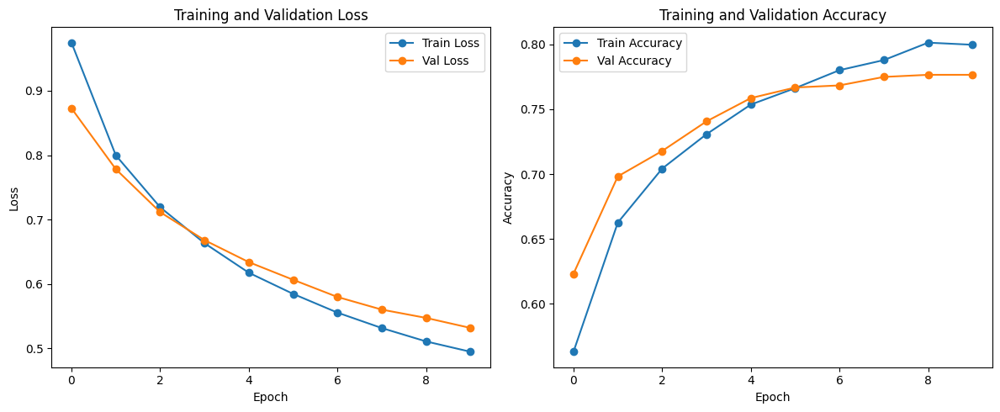

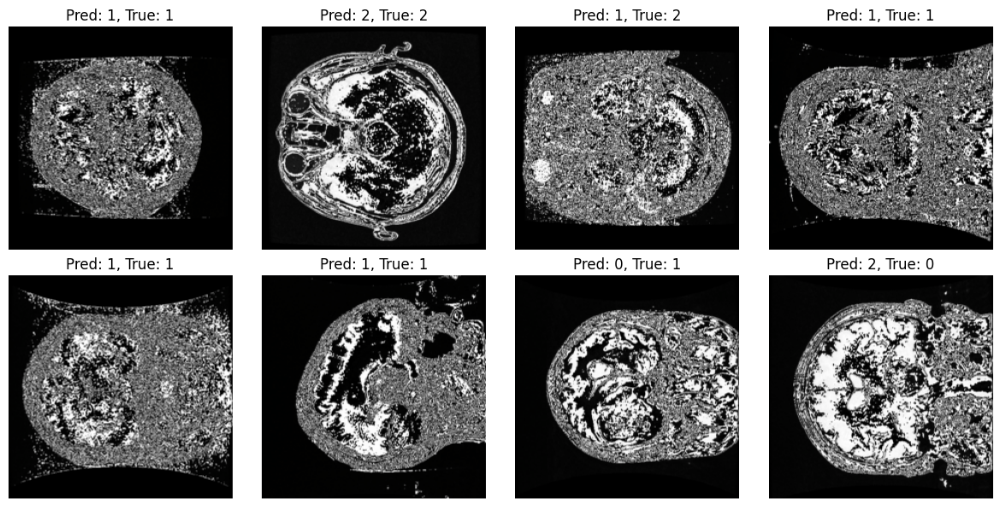


--- Computing Details ---
Device: cuda:0
GPU Name: Tesla T4
Total GPU Memory: 14.74 GB
Allocated GPU Memory: 0.66 GB
Cached GPU Memory: 0.99 GB


In [ ]:
import os
import glob
import numpy as np
import h5py
from PIL import Image
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from torchvision import models

# --------------------------
# Device and GPU Information
# --------------------------
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)
if device.type == "cuda":
    gpu_props = torch.cuda.get_device_properties(0)
    print("GPU Name:", torch.cuda.get_device_name(0))
    print("Total GPU Memory: {:.2f} GB".format(gpu_props.total_memory / (1024**3)))

# --------------------------
# Function to Load MATLAB Files using h5py
# --------------------------
def load_matlab_file(file_path):
    """
    Load a MATLAB file saved in v7.3 format using h5py.
    This function first checks for a 'cjdata' group and returns its fields.
    If not found, it loads keys from the top level.
    """
    with h5py.File(file_path, 'r') as f:
        if "cjdata" in f:
            group = f["cjdata"]
            label = group["label"][()]
            image = group["image"][()]
            tumorBorder = group["tumorBorder"][()] if "tumorBorder" in group else None
            tumorMask = group["tumorMask"][()] if "tumorMask" in group else None
            PID = group["PID"][()] if "PID" in group else None
            return {"label": label, "image": image, "tumorBorder": tumorBorder, "tumorMask": tumorMask, "PID": PID}
        else:
            # Fallback: return all keys in the file
            data = {k: f[k][()] for k in f.keys()}
            return data

# --------------------------
# Custom Dataset Definition
# --------------------------
class BrainTumorDataset(Dataset):
    def __init__(self, file_list, transform=None):
        self.file_list = file_list
        self.transform = transform

    def __len__(self):
        return len(self.file_list)

    def __getitem__(self, idx):
        file_path = self.file_list[idx]
        data = load_matlab_file(file_path)

        if "label" not in data:
            raise KeyError(f"'label' not found in file: {file_path}")
        label = data["label"]
        # Squeeze dimensions in case label is stored as an array (e.g., shape (1,1))
        label = int(np.squeeze(label))

        if "image" not in data:
            raise KeyError(f"'image' not found in file: {file_path}")
        image = data["image"]
        # If grayscale, convert to 3 channels.
        if image.ndim == 2:
            image = np.stack([image] * 3, axis=-1)
        # Normalize image to uint8 if necessary.
        if image.dtype != np.uint8:
            image = (255 * (image - np.min(image)) / (np.ptp(image) + 1e-8)).astype(np.uint8)

        image = Image.fromarray(image)
        if self.transform:
            image = self.transform(image)
        # Adjust label from 1-indexed (MATLAB) to 0-indexed.
        return image, label - 1

# --------------------------
# Data Transforms & Preprocessing
# --------------------------
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ]),
}

# --------------------------
# Prepare Dataset and DataLoaders
# --------------------------
dataset_dir = "/root/.cache/kagglehub/datasets/ashkhagan/figshare-brain-tumor-dataset/versions/1"
all_files = glob.glob(os.path.join(dataset_dir, '**', '*.mat'), recursive=True)
all_files = [f for f in all_files if "cvind" not in os.path.basename(f).lower()]
print("Total .mat data files found:", len(all_files))

# Shuffle and split into training (80%) and validation (20%) sets.
np.random.shuffle(all_files)
split_idx = int(0.8 * len(all_files))
train_files = all_files[:split_idx]
val_files = all_files[split_idx:]
print("Train files:", len(train_files), "Validation files:", len(val_files))

train_dataset = BrainTumorDataset(train_files, transform=data_transforms['train'])
val_dataset = BrainTumorDataset(val_files, transform=data_transforms['val'])

batch_size = 16
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

# --------------------------
# Define the Teacher Model (Two ViT-B-16 Models)
# --------------------------
class TwoViTHybridModel(nn.Module):
    def __init__(self, num_classes, use_pretrained=True, feature_extract=True):
        super(TwoViTHybridModel, self).__init__()

        # First Vision Transformer (ViT-B-16)
        self.vit1 = models.vit_b_16(pretrained=use_pretrained)
        self.set_parameter_requires_grad(self.vit1, feature_extract)
        num_ftrs_vit1 = self.vit1.heads.head.in_features
        self.vit1.heads.head = nn.Linear(num_ftrs_vit1, num_classes)

        # Second Vision Transformer (ViT-B-16)
        self.vit2 = models.vit_b_16(pretrained=use_pretrained)
        self.set_parameter_requires_grad(self.vit2, feature_extract)
        num_ftrs_vit2 = self.vit2.heads.head.in_features
        self.vit2.heads.head = nn.Linear(num_ftrs_vit2, num_classes)

        # Combined classifier that fuses outputs from both ViTs
        self.classifier = nn.Linear(num_classes * 2, num_classes)

    def set_parameter_requires_grad(self, model, feature_extracting):
        if feature_extracting:
            for param in model.parameters():
                param.requires_grad = False

    def forward(self, x):
        vit1_out = self.vit1(x)
        vit2_out = self.vit2(x)
        combined_out = torch.cat((vit1_out, vit2_out), dim=1)
        output = self.classifier(combined_out)
        return output

def initialize_teacher_model(num_classes, feature_extract, use_pretrained=True):
    model = TwoViTHybridModel(num_classes, use_pretrained, feature_extract)
    input_size = 224
    return model, input_size

num_classes = 3  # For example, three tumor types: meningioma, glioma, pituitary tumor
teacher_model, input_size = initialize_teacher_model(num_classes, feature_extract=True, use_pretrained=True)
teacher_model = teacher_model.to(device)

# Print model summary
print("Teacher Model Architecture (Two ViTs):")
print(teacher_model)

# --------------------------
# Define Loss Function and Optimizer
# --------------------------
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(filter(lambda p: p.requires_grad, teacher_model.parameters()), lr=1e-4)

# --------------------------
# Training and Validation Loop
# --------------------------
num_epochs = 10
train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []

for epoch in range(num_epochs):
    print(f"\nEpoch {epoch+1}/{num_epochs}")

    # Training Phase
    teacher_model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    for inputs, labels in train_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = teacher_model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * inputs.size(0)
        _, preds = torch.max(outputs, 1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total
    train_losses.append(epoch_loss)
    train_accuracies.append(epoch_acc)
    print(f"Train Loss: {epoch_loss:.4f}, Train Acc: {epoch_acc:.4f}")

    # Validation Phase
    teacher_model.eval()
    running_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = teacher_model(inputs)
            loss = criterion(outputs, labels)
            running_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total
    val_losses.append(epoch_loss)
    val_accuracies.append(epoch_acc)
    print(f"Val Loss: {epoch_loss:.4f}, Val Acc: {epoch_acc:.4f}")

# --------------------------
# Save the Teacher Model
# --------------------------
teacher_model_path = "teacher_two_vit_model.pth"
torch.save(teacher_model.state_dict(), teacher_model_path)
print(f"Teacher model saved to {teacher_model_path}")

# --------------------------
# Visualization of Training Curves
# --------------------------
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label="Train Loss", marker="o")
plt.plot(val_losses, label="Val Loss", marker="o")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label="Train Accuracy", marker="o")
plt.plot(val_accuracies, label="Val Accuracy", marker="o")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuracy")
plt.legend()

plt.tight_layout()
plt.show()

# --------------------------
# Visualize Sample Predictions
# --------------------------
teacher_model.eval()
sample_loader = DataLoader(val_dataset, batch_size=8, shuffle=True)
inputs, labels = next(iter(sample_loader))
inputs = inputs.to(device)
outputs = teacher_model(inputs)
_, preds = torch.max(outputs, 1)
inputs = inputs.cpu()

# Inverse normalization for visualization
inv_normalize = transforms.Normalize(
    mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
    std=[1/0.229, 1/0.224, 1/0.225]
)

fig, axes = plt.subplots(2, 4, figsize=(12, 6))
axes = axes.flatten()
for img, pred, true, ax in zip(inputs, preds, labels, axes):
    img = inv_normalize(img)
    img = torch.clamp(img, 0, 1)
    ax.imshow(img.permute(1, 2, 0))
    ax.set_title(f"Pred: {pred.item()}, True: {true.item()}")
    ax.axis("off")
plt.tight_layout()
plt.show()

# --------------------------
# Log Additional Computing Details
# --------------------------
print("\n--- Computing Details ---")
print("Device:", device)
if device.type == "cuda":
    print("GPU Name:", torch.cuda.get_device_name(0))
    print("Total GPU Memory: {:.2f} GB".format(torch.cuda.get_device_properties(0).total_memory / (1024**3)))
    print("Allocated GPU Memory: {:.2f} GB".format(torch.cuda.memory_allocated(0) / (1024**3)))
    print("Cached GPU Memory: {:.2f} GB".format(torch.cuda.memory_reserved(0) / (1024**3)))


Using device: cuda:0
GPU Name: Tesla T4
Total GPU Memory: 14.74 GB
Total .mat data files found: 3064
Train files: 2451 Validation files: 613


<ipython-input-3-de6c45430bf0>:163: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  teacher_model.load_state_dict(torch.load(teacher_model_path, map_location=device))


Loaded Teacher Model:
TwoViTHybridModel(
  (vit1): VisionTransformer(
    (conv_proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    (encoder): Encoder(
      (dropout): Dropout(p=0.0, inplace=False)
      (layers): Sequential(
        (encoder_layer_0): EncoderBlock(
          (ln_1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
          (self_attention): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
          )
          (dropout): Dropout(p=0.0, inplace=False)
          (ln_2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
          (mlp): MLPBlock(
            (0): Linear(in_features=768, out_features=3072, bias=True)
            (1): GELU(approximate='none')
            (2): Dropout(p=0.0, inplace=False)
            (3): Linear(in_features=3072, out_features=768, bias=True)
            (4): Dropout(p=0.0, inplace=False)
          )
        )
        (encoder_layer_1): EncoderB

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 148MB/s]


Student Model (EfficientNet) Architecture:
EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
 

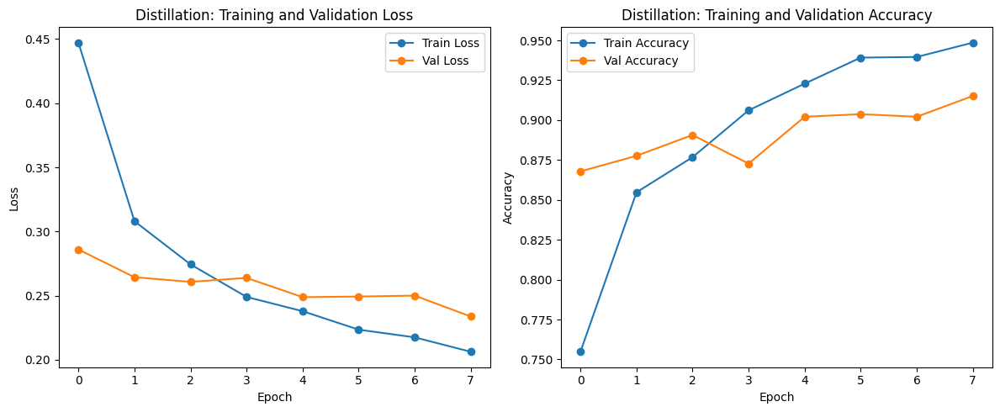

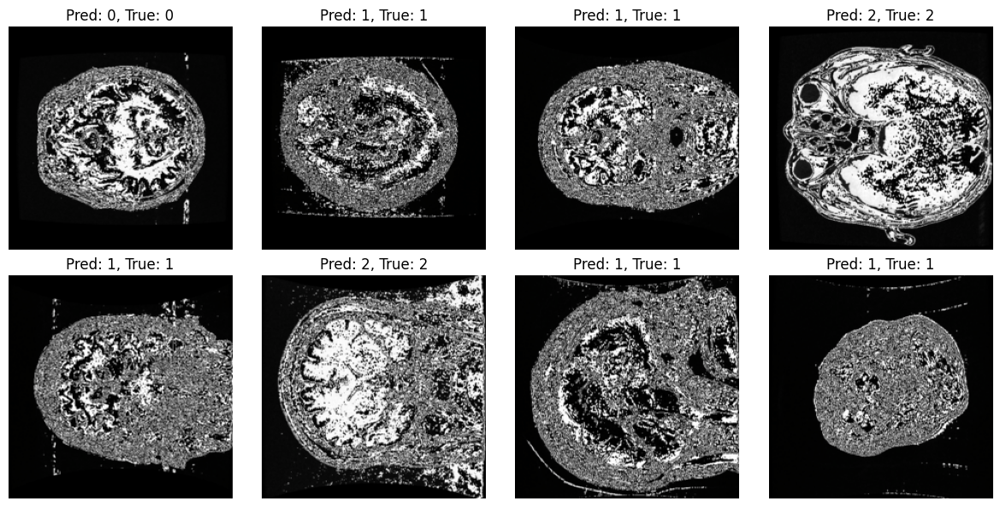


--- Computing Details ---
Device: cuda:0
GPU Name: Tesla T4
Total GPU Memory: 14.74 GB
Allocated GPU Memory: 1.39 GB
Cached GPU Memory: 2.29 GB


In [ ]:
import os
import glob
import numpy as np
import h5py
from PIL import Image
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from torchvision import models

# --------------------------
# Device and GPU Information
# --------------------------
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)
if device.type == "cuda":
    gpu_props = torch.cuda.get_device_properties(0)
    print("GPU Name:", torch.cuda.get_device_name(0))
    print("Total GPU Memory: {:.2f} GB".format(gpu_props.total_memory / (1024**3)))

# --------------------------
# Function to Load MATLAB Files using h5py
# --------------------------
def load_matlab_file(file_path):
    """
    Load a MATLAB file saved in v7.3 format using h5py.
    This function first checks for a 'cjdata' group and returns its fields.
    If not found, it loads keys from the top level.
    """
    with h5py.File(file_path, 'r') as f:
        if "cjdata" in f:
            group = f["cjdata"]
            label = group["label"][()]
            image = group["image"][()]
            tumorBorder = group["tumorBorder"][()] if "tumorBorder" in group else None
            tumorMask = group["tumorMask"][()] if "tumorMask" in group else None
            PID = group["PID"][()] if "PID" in group else None
            return {"label": label, "image": image, "tumorBorder": tumorBorder, "tumorMask": tumorMask, "PID": PID}
        else:
            data = {k: f[k][()] for k in f.keys()}
            return data

# --------------------------
# Custom Dataset Definition
# --------------------------
class BrainTumorDataset(Dataset):
    def __init__(self, file_list, transform=None):
        self.file_list = file_list
        self.transform = transform

    def __len__(self):
        return len(self.file_list)

    def __getitem__(self, idx):
        file_path = self.file_list[idx]
        data = load_matlab_file(file_path)

        if "label" not in data:
            raise KeyError(f"'label' not found in file: {file_path}")
        label = data["label"]
        label = int(np.squeeze(label))

        if "image" not in data:
            raise KeyError(f"'image' not found in file: {file_path}")
        image = data["image"]
        if image.ndim == 2:
            image = np.stack([image] * 3, axis=-1)
        if image.dtype != np.uint8:
            image = (255 * (image - np.min(image)) / (np.ptp(image) + 1e-8)).astype(np.uint8)

        image = Image.fromarray(image)
        if self.transform:
            image = self.transform(image)
        return image, label - 1  # convert from 1-indexed to 0-indexed

# --------------------------
# Data Transforms & Preprocessing
# --------------------------
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ]),
}

# --------------------------
# Prepare Dataset and DataLoaders
# --------------------------
dataset_dir = "/root/.cache/kagglehub/datasets/ashkhagan/figshare-brain-tumor-dataset/versions/1"
all_files = glob.glob(os.path.join(dataset_dir, '**', '*.mat'), recursive=True)
all_files = [f for f in all_files if "cvind" not in os.path.basename(f).lower()]
print("Total .mat data files found:", len(all_files))

np.random.shuffle(all_files)
split_idx = int(0.8 * len(all_files))
train_files = all_files[:split_idx]
val_files = all_files[split_idx:]
print("Train files:", len(train_files), "Validation files:", len(val_files))

train_dataset = BrainTumorDataset(train_files, transform=data_transforms['train'])
val_dataset = BrainTumorDataset(val_files, transform=data_transforms['val'])

batch_size = 16
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

# --------------------------
# Define Teacher Model (TwoViT Hybrid)
# --------------------------
class TwoViTHybridModel(nn.Module):
    def __init__(self, num_classes, use_pretrained=True, feature_extract=True):
        super(TwoViTHybridModel, self).__init__()

        # First Vision Transformer (ViT-B-16)
        self.vit1 = models.vit_b_16(pretrained=use_pretrained)
        self.set_parameter_requires_grad(self.vit1, feature_extract)
        num_ftrs_vit1 = self.vit1.heads.head.in_features
        self.vit1.heads.head = nn.Linear(num_ftrs_vit1, num_classes)

        # Second Vision Transformer (ViT-B-16)
        self.vit2 = models.vit_b_16(pretrained=use_pretrained)
        self.set_parameter_requires_grad(self.vit2, feature_extract)
        num_ftrs_vit2 = self.vit2.heads.head.in_features
        self.vit2.heads.head = nn.Linear(num_ftrs_vit2, num_classes)

        # Combined classifier that fuses outputs from both ViTs
        self.classifier = nn.Linear(num_classes * 2, num_classes)

    def set_parameter_requires_grad(self, model, feature_extracting):
        if feature_extracting:
            for param in model.parameters():
                param.requires_grad = False

    def forward(self, x):
        vit1_out = self.vit1(x)
        vit2_out = self.vit2(x)
        combined_out = torch.cat((vit1_out, vit2_out), dim=1)
        output = self.classifier(combined_out)
        return output

def initialize_teacher_model(num_classes, feature_extract, use_pretrained=True):
    model = TwoViTHybridModel(num_classes, use_pretrained, feature_extract)
    input_size = 224
    return model, input_size

num_classes = 3  # e.g., meningioma, glioma, pituitary tumor
teacher_model, _ = initialize_teacher_model(num_classes, feature_extract=True, use_pretrained=True)
teacher_model_path = "teacher_two_vit_model.pth"
teacher_model.load_state_dict(torch.load(teacher_model_path, map_location=device))
teacher_model = teacher_model.to(device)
teacher_model.eval()  # set teacher to evaluation mode

print("Loaded Teacher Model:")
print(teacher_model)

# --------------------------
# Define Student Model (EfficientNet)
# --------------------------
# Here we use EfficientNet-B0; you can switch to other EfficientNet variants if desired.
student_model = models.efficientnet_b0(pretrained=True)
# Replace the classification head to output num_classes predictions.
num_ftrs_student = student_model.classifier[1].in_features
student_model.classifier[1] = nn.Linear(num_ftrs_student, num_classes)
student_model = student_model.to(device)

print("Student Model (EfficientNet) Architecture:")
print(student_model)

# --------------------------
# Define Knowledge Distillation Loss Function
# --------------------------
def distillation_loss(student_logits, teacher_logits, labels, T=4.0, alpha=0.5):
    """
    Compute the knowledge distillation loss given student and teacher logits.
    T: Temperature
    alpha: weight for hard target loss vs soft target loss.
    """
    # Soft target loss: KL divergence between teacher and student probabilities (with temperature scaling)
    soft_teacher_probs = F.softmax(teacher_logits / T, dim=1)
    soft_student_log_probs = F.log_softmax(student_logits / T, dim=1)
    kd_loss = F.kl_div(soft_student_log_probs, soft_teacher_probs, reduction='batchmean') * (T * T)
    # Hard target loss: cross-entropy with the true labels.
    ce_loss = F.cross_entropy(student_logits, labels)
    return alpha * ce_loss + (1 - alpha) * kd_loss

# --------------------------
# Define Optimizer
# --------------------------
optimizer = optim.Adam(student_model.parameters(), lr=1e-4)

# --------------------------
# Training and Validation Loop for Distillation
# --------------------------
num_epochs = 8
train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []

for epoch in range(num_epochs):
    print(f"\nEpoch {epoch+1}/{num_epochs}")

    # Training Phase
    student_model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    for inputs, labels in train_loader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        # Teacher predictions (with no gradient tracking)
        with torch.no_grad():
            teacher_logits = teacher_model(inputs)
        # Student predictions
        student_logits = student_model(inputs)
        loss = distillation_loss(student_logits, teacher_logits, labels, T=4.0, alpha=0.5)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * inputs.size(0)
        _, preds = torch.max(student_logits, 1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total
    train_losses.append(epoch_loss)
    train_accuracies.append(epoch_acc)
    print(f"Train Loss: {epoch_loss:.4f}, Train Acc: {epoch_acc:.4f}")

    # Validation Phase
    student_model.eval()
    running_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            teacher_logits = teacher_model(inputs)
            student_logits = student_model(inputs)
            loss = distillation_loss(student_logits, teacher_logits, labels, T=4.0, alpha=0.5)
            running_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(student_logits, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total
    val_losses.append(epoch_loss)
    val_accuracies.append(epoch_acc)
    print(f"Val Loss: {epoch_loss:.4f}, Val Acc: {epoch_acc:.4f}")

# --------------------------
# Save the Student Model (After Distillation)
# --------------------------
student_model_path = "student_efficientnet_distilled.pth"
torch.save(student_model.state_dict(), student_model_path)
print(f"Student model saved to {student_model_path}")

# --------------------------
# Visualization of Training Curves
# --------------------------
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label="Train Loss", marker="o")
plt.plot(val_losses, label="Val Loss", marker="o")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Distillation: Training and Validation Loss")
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label="Train Accuracy", marker="o")
plt.plot(val_accuracies, label="Val Accuracy", marker="o")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Distillation: Training and Validation Accuracy")
plt.legend()

plt.tight_layout()
plt.show()

# --------------------------
# Visualize Sample Predictions (Student Model)
# --------------------------
student_model.eval()
sample_loader = DataLoader(val_dataset, batch_size=8, shuffle=True)
inputs, labels = next(iter(sample_loader))
inputs = inputs.to(device)
outputs = student_model(inputs)
_, preds = torch.max(outputs, 1)
inputs = inputs.cpu()

# Inverse normalization for visualization
inv_normalize = transforms.Normalize(
    mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
    std=[1/0.229, 1/0.224, 1/0.225]
)

fig, axes = plt.subplots(2, 4, figsize=(12, 6))
axes = axes.flatten()
for img, pred, true, ax in zip(inputs, preds, labels, axes):
    img = inv_normalize(img)
    img = torch.clamp(img, 0, 1)
    ax.imshow(img.permute(1, 2, 0))
    ax.set_title(f"Pred: {pred.item()}, True: {true.item()}")
    ax.axis("off")
plt.tight_layout()
plt.show()

# --------------------------
# Log Additional Computing Details
# --------------------------
print("\n--- Computing Details ---")
print("Device:", device)
if device.type == "cuda":
    print("GPU Name:", torch.cuda.get_device_name(0))
    print("Total GPU Memory: {:.2f} GB".format(torch.cuda.get_device_properties(0).total_memory / (1024**3)))
    print("Allocated GPU Memory: {:.2f} GB".format(torch.cuda.memory_allocated(0) / (1024**3)))
    print("Cached GPU Memory: {:.2f} GB".format(torch.cuda.memory_reserved(0) / (1024**3)))


Using device: cuda:0
GPU Name: Tesla T4
Total GPU Memory: 14.74 GB
Total .mat data files found: 3064
Train files: 2451 Validation files: 613


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_BN_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_BN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19_bn-c79401a0.pth" to /root/.cache/torch/hub/checkpoints/vgg19_bn-c79401a0.pth
100%|██████████| 548M/548M [00:05<00:00, 107MB/s]


Teacher Model Architecture (Hybrid CNN + ViT):
HybridModel(
  (vgg): VGG(
    (features): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
      (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (7): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (8): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (9): ReLU(inplace=True)
      (10): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (12): ReLU(inplace=True)
      (13): M

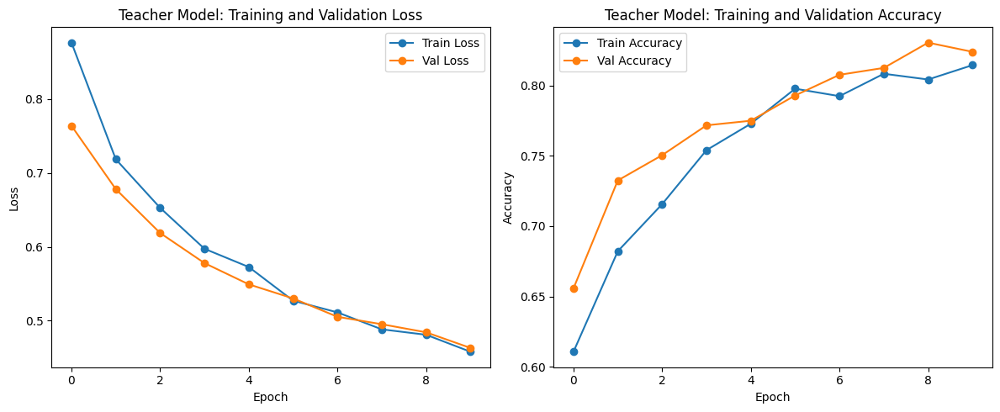

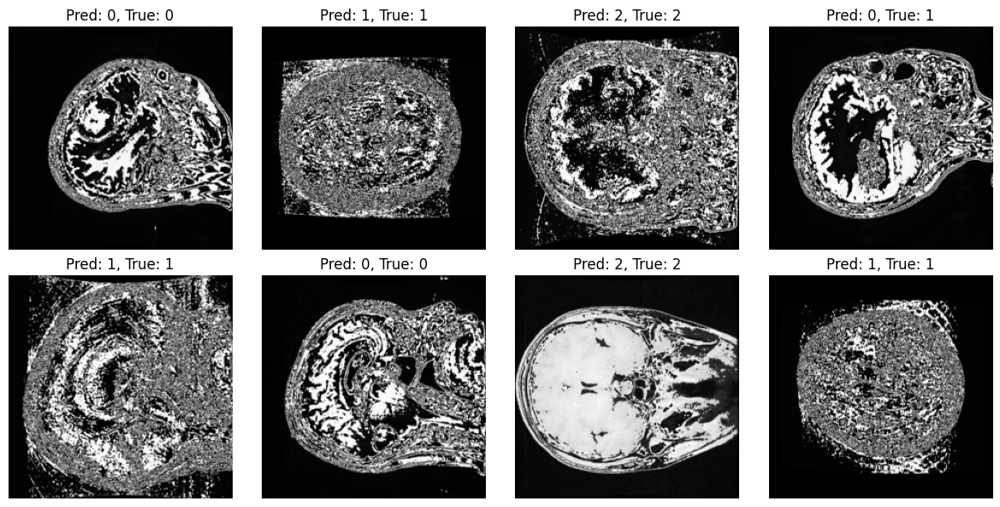


--- Computing Details ---
Device: cuda:0
GPU Name: Tesla T4
Total GPU Memory: 14.74 GB
Allocated GPU Memory: 0.90 GB
Cached GPU Memory: 3.92 GB


In [ ]:
import os
import glob
import numpy as np
import h5py
from PIL import Image
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from torchvision import models

# --------------------------
# Device and GPU Information
# --------------------------
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)
if device.type == "cuda":
    gpu_props = torch.cuda.get_device_properties(0)
    print("GPU Name:", torch.cuda.get_device_name(0))
    print("Total GPU Memory: {:.2f} GB".format(gpu_props.total_memory / (1024**3)))

# --------------------------
# Function to Load MATLAB Files using h5py
# --------------------------
def load_matlab_file(file_path):
    with h5py.File(file_path, 'r') as f:
        if "cjdata" in f:
            group = f["cjdata"]
            label = group["label"][()]
            image = group["image"][()]
            tumorBorder = group["tumorBorder"][()] if "tumorBorder" in group else None
            tumorMask = group["tumorMask"][()] if "tumorMask" in group else None
            PID = group["PID"][()] if "PID" in group else None
            return {"label": label, "image": image, "tumorBorder": tumorBorder, "tumorMask": tumorMask, "PID": PID}
        else:
            data = {k: f[k][()] for k in f.keys()}
            return data

# --------------------------
# Custom Dataset Definition
# --------------------------
class BrainTumorDataset(Dataset):
    def __init__(self, file_list, transform=None):
        self.file_list = file_list
        self.transform = transform

    def __len__(self):
        return len(self.file_list)

    def __getitem__(self, idx):
        file_path = self.file_list[idx]
        data = load_matlab_file(file_path)

        if "label" not in data:
            raise KeyError(f"'label' not found in file: {file_path}")
        label = int(np.squeeze(data["label"]))

        if "image" not in data:
            raise KeyError(f"'image' not found in file: {file_path}")
        image = data["image"]
        if image.ndim == 2:
            image = np.stack([image] * 3, axis=-1)
        if image.dtype != np.uint8:
            image = (255 * (image - np.min(image)) / (np.ptp(image) + 1e-8)).astype(np.uint8)
        image = Image.fromarray(image)
        if self.transform:
            image = self.transform(image)
        return image, label - 1  # adjust from MATLAB 1-indexing to 0-indexing

# --------------------------
# Data Transforms & Preprocessing
# --------------------------
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ]),
}

# --------------------------
# Prepare Dataset and DataLoaders
# --------------------------
dataset_dir = "/root/.cache/kagglehub/datasets/ashkhagan/figshare-brain-tumor-dataset/versions/1"
all_files = glob.glob(os.path.join(dataset_dir, '**', '*.mat'), recursive=True)
all_files = [f for f in all_files if "cvind" not in os.path.basename(f).lower()]
print("Total .mat data files found:", len(all_files))

np.random.shuffle(all_files)
split_idx = int(0.8 * len(all_files))
train_files = all_files[:split_idx]
val_files = all_files[split_idx:]
print("Train files:", len(train_files), "Validation files:", len(val_files))

train_dataset = BrainTumorDataset(train_files, transform=data_transforms['train'])
val_dataset = BrainTumorDataset(val_files, transform=data_transforms['val'])
batch_size = 16
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

# --------------------------
# Define the Teacher Model (Hybrid: VGG19 + ViT)
# --------------------------
class HybridModel(nn.Module):
    def __init__(self, num_classes, use_pretrained=True, feature_extract=True):
        super(HybridModel, self).__init__()

        # VGG19 with batch normalization branch
        self.vgg = models.vgg19_bn(pretrained=use_pretrained)
        self.set_parameter_requires_grad(self.vgg, feature_extract)
        num_ftrs_vgg = self.vgg.classifier[6].in_features
        self.vgg.classifier[6] = nn.Linear(num_ftrs_vgg, num_classes)

        # Vision Transformer branch (ViT-B-16)
        self.vit = models.vit_b_16(pretrained=use_pretrained)
        self.set_parameter_requires_grad(self.vit, feature_extract)
        num_ftrs_vit = self.vit.heads.head.in_features
        self.vit.heads.head = nn.Linear(num_ftrs_vit, num_classes)

        # Combined classifier that fuses outputs from VGG and ViT
        self.classifier = nn.Linear(num_classes * 2, num_classes)

    def set_parameter_requires_grad(self, model, feature_extracting):
        if feature_extracting:
            for param in model.parameters():
                param.requires_grad = False

    def forward(self, x):
        vgg_out = self.vgg(x)
        vit_out = self.vit(x)
        combined_out = torch.cat((vgg_out, vit_out), dim=1)
        output = self.classifier(combined_out)
        return output

def initialize_teacher_model(num_classes, feature_extract, use_pretrained=True):
    model_ft = HybridModel(num_classes, use_pretrained, feature_extract)
    input_size = 224
    return model_ft, input_size

num_classes = 3  # e.g., meningioma, glioma, pituitary tumor
teacher_model, input_size = initialize_teacher_model(num_classes, feature_extract=True, use_pretrained=True)
teacher_model = teacher_model.to(device)

print("Teacher Model Architecture (Hybrid CNN + ViT):")
print(teacher_model)

# --------------------------
# Define Loss Function and Optimizer
# --------------------------
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(filter(lambda p: p.requires_grad, teacher_model.parameters()), lr=1e-4)

# --------------------------
# Training and Validation Loop for Teacher Model
# --------------------------
num_epochs = 10
train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []

for epoch in range(num_epochs):
    print(f"\nEpoch {epoch+1}/{num_epochs}")
    teacher_model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = teacher_model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * inputs.size(0)
        _, preds = torch.max(outputs, 1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total
    train_losses.append(epoch_loss)
    train_accuracies.append(epoch_acc)
    print(f"Train Loss: {epoch_loss:.4f}, Train Acc: {epoch_acc:.4f}")

    teacher_model.eval()
    running_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = teacher_model(inputs)
            loss = criterion(outputs, labels)
            running_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)
    epoch_loss = running_loss / total
    epoch_acc = correct / total
    val_losses.append(epoch_loss)
    val_accuracies.append(epoch_acc)
    print(f"Val Loss: {epoch_loss:.4f}, Val Acc: {epoch_acc:.4f}")

# --------------------------
# Save the Teacher Model
# --------------------------
teacher_model_path = "teacher_cnn_vit_model.pth"
torch.save(teacher_model.state_dict(), teacher_model_path)
print(f"Teacher model saved to {teacher_model_path}")

# --------------------------
# Visualization of Training Curves & Sample Predictions
# --------------------------
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label="Train Loss", marker="o")
plt.plot(val_losses, label="Val Loss", marker="o")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Teacher Model: Training and Validation Loss")
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label="Train Accuracy", marker="o")
plt.plot(val_accuracies, label="Val Accuracy", marker="o")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Teacher Model: Training and Validation Accuracy")
plt.legend()

plt.tight_layout()
plt.show()

# Visualize some sample predictions
teacher_model.eval()
sample_loader = DataLoader(val_dataset, batch_size=8, shuffle=True)
inputs, labels = next(iter(sample_loader))
inputs = inputs.to(device)
outputs = teacher_model(inputs)
_, preds = torch.max(outputs, 1)
inputs = inputs.cpu()

inv_normalize = transforms.Normalize(
    mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
    std=[1/0.229, 1/0.224, 1/0.225]
)

fig, axes = plt.subplots(2, 4, figsize=(12, 6))
for img, pred, true, ax in zip(inputs, preds, labels, axes.flatten()):
    img = inv_normalize(img)
    img = torch.clamp(img, 0, 1)
    ax.imshow(img.permute(1, 2, 0))
    ax.set_title(f"Pred: {pred.item()}, True: {true.item()}")
    ax.axis("off")
plt.tight_layout()
plt.show()

print("\n--- Computing Details ---")
print("Device:", device)
if device.type == "cuda":
    print("GPU Name:", torch.cuda.get_device_name(0))
    print("Total GPU Memory: {:.2f} GB".format(torch.cuda.get_device_properties(0).total_memory / (1024**3)))
    print("Allocated GPU Memory: {:.2f} GB".format(torch.cuda.memory_allocated(0) / (1024**3)))
    print("Cached GPU Memory: {:.2f} GB".format(torch.cuda.memory_reserved(0) / (1024**3)))


Using device: cuda:0
GPU Name: Tesla T4
Total GPU Memory: 14.74 GB


<ipython-input-5-c64247cc57e6>:134: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  teacher_model.load_state_dict(torch.load(teacher_model_path, map_location=device))


Loaded Teacher Model for KD.
Student Model (EfficientNet):
EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activati

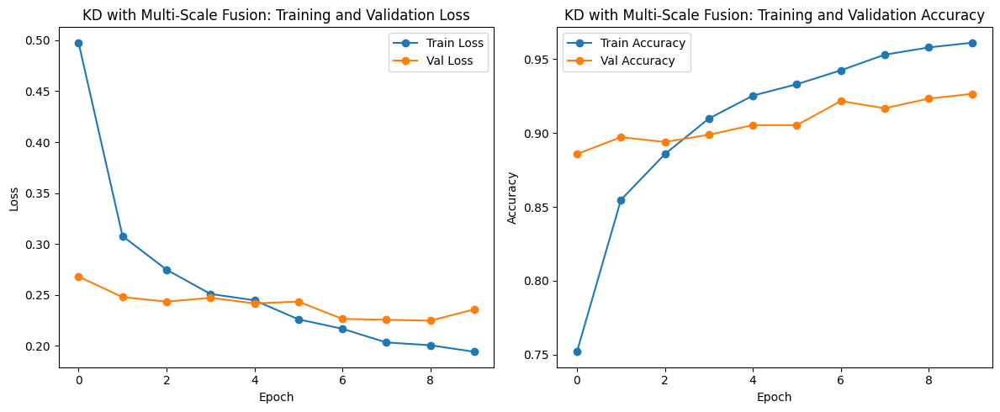

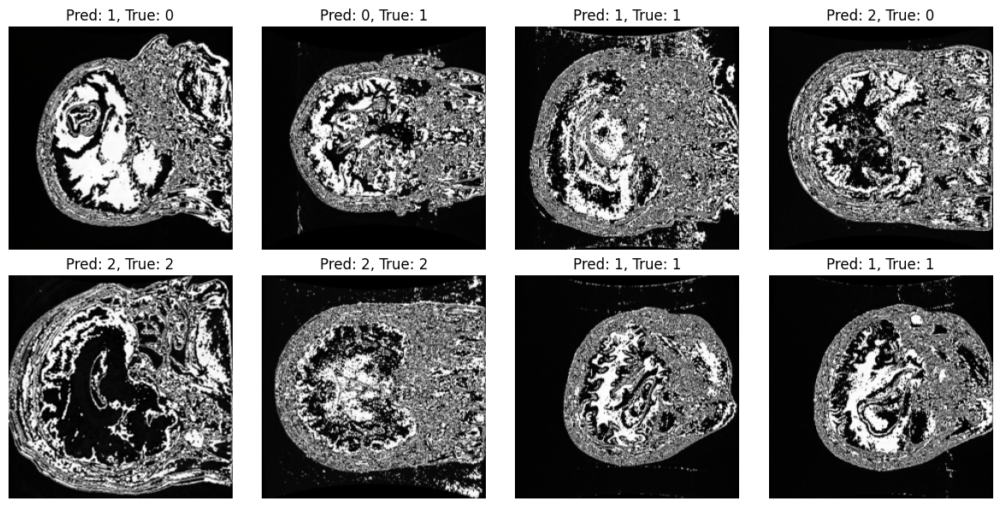


--- Computing Details ---
Device: cuda:0
GPU Name: Tesla T4
Total GPU Memory: 14.74 GB
Allocated GPU Memory: 1.60 GB
Cached GPU Memory: 3.92 GB


In [ ]:
import os
import glob
import numpy as np
import h5py
from PIL import Image
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from torchvision import models

# --------------------------
# Device and GPU Information
# --------------------------
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)
if device.type == "cuda":
    gpu_props = torch.cuda.get_device_properties(0)
    print("GPU Name:", torch.cuda.get_device_name(0))
    print("Total GPU Memory: {:.2f} GB".format(gpu_props.total_memory / (1024**3)))

# --------------------------
# Data Loading and Preprocessing (Same as before)
# --------------------------
def load_matlab_file(file_path):
    with h5py.File(file_path, 'r') as f:
        if "cjdata" in f:
            group = f["cjdata"]
            label = group["label"][()]
            image = group["image"][()]
            tumorBorder = group["tumorBorder"][()] if "tumorBorder" in group else None
            tumorMask = group["tumorMask"][()] if "tumorMask" in group else None
            PID = group["PID"][()] if "PID" in group else None
            return {"label": label, "image": image, "tumorBorder": tumorBorder, "tumorMask": tumorMask, "PID": PID}
        else:
            data = {k: f[k][()] for k in f.keys()}
            return data

class BrainTumorDataset(Dataset):
    def __init__(self, file_list, transform=None):
        self.file_list = file_list
        self.transform = transform
    def __len__(self):
        return len(self.file_list)
    def __getitem__(self, idx):
        file_path = self.file_list[idx]
        data = load_matlab_file(file_path)
        if "label" not in data:
            raise KeyError(f"'label' not found in file: {file_path}")
        label = int(np.squeeze(data["label"]))
        if "image" not in data:
            raise KeyError(f"'image' not found in file: {file_path}")
        image = data["image"]
        if image.ndim == 2:
            image = np.stack([image]*3, axis=-1)
        if image.dtype != np.uint8:
            image = (255*(image - np.min(image))/(np.ptp(image)+1e-8)).astype(np.uint8)
        image = Image.fromarray(image)
        if self.transform:
            image = self.transform(image)
        return image, label-1

data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225])
    ]),
}

dataset_dir = "/root/.cache/kagglehub/datasets/ashkhagan/figshare-brain-tumor-dataset/versions/1"
import os
import glob
all_files = glob.glob(os.path.join(dataset_dir, '**', '*.mat'), recursive=True)
all_files = [f for f in all_files if "cvind" not in os.path.basename(f).lower()]
np.random.shuffle(all_files)
split_idx = int(0.8 * len(all_files))
train_files = all_files[:split_idx]
val_files = all_files[split_idx:]
train_dataset = BrainTumorDataset(train_files, transform=data_transforms['train'])
val_dataset = BrainTumorDataset(val_files, transform=data_transforms['val'])
batch_size = 16
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

# --------------------------
# Load the Pre-trained Teacher Model
# --------------------------
class HybridModel(nn.Module):
    def __init__(self, num_classes, use_pretrained=True, feature_extract=True):
        super(HybridModel, self).__init__()
        # VGG19 branch (CNN)
        self.vgg = models.vgg19_bn(pretrained=use_pretrained)
        self.set_parameter_requires_grad(self.vgg, feature_extract)
        num_ftrs_vgg = self.vgg.classifier[6].in_features
        self.vgg.classifier[6] = nn.Linear(num_ftrs_vgg, num_classes)
        # ViT branch
        self.vit = models.vit_b_16(pretrained=use_pretrained)
        self.set_parameter_requires_grad(self.vit, feature_extract)
        num_ftrs_vit = self.vit.heads.head.in_features
        self.vit.heads.head = nn.Linear(num_ftrs_vit, num_classes)
        # Combined classifier
        self.classifier = nn.Linear(num_classes * 2, num_classes)
    def set_parameter_requires_grad(self, model, feature_extracting):
        if feature_extracting:
            for param in model.parameters():
                param.requires_grad = False
    def forward(self, x):
        vgg_out = self.vgg(x)
        vit_out = self.vit(x)
        combined_out = torch.cat((vgg_out, vit_out), dim=1)
        output = self.classifier(combined_out)
        return output

def initialize_teacher_model(num_classes, feature_extract, use_pretrained=True):
    model_ft = HybridModel(num_classes, use_pretrained, feature_extract)
    return model_ft

num_classes = 3
teacher_model = initialize_teacher_model(num_classes, feature_extract=True, use_pretrained=True)
teacher_model_path = "teacher_cnn_vit_model.pth"
teacher_model.load_state_dict(torch.load(teacher_model_path, map_location=device))
teacher_model = teacher_model.to(device)
teacher_model.eval()
print("Loaded Teacher Model for KD.")

# --------------------------
# Define the Student Model (EfficientNet)
# --------------------------
student_model = models.efficientnet_b0(pretrained=True)
num_ftrs_student = student_model.classifier[1].in_features
student_model.classifier[1] = nn.Linear(num_ftrs_student, num_classes)
student_model = student_model.to(device)
print("Student Model (EfficientNet):")
print(student_model)

# --------------------------
# Register Hooks for Intermediate Features
# We choose one intermediate layer from teacher's CNN branch (vgg.features)
# and a corresponding layer from the student. Adjust these as needed.
# --------------------------
intermediate_teacher_features = {}
intermediate_student_features = {}

def teacher_hook(module, input, output):
    intermediate_teacher_features['feat'] = output

def student_hook(module, input, output):
    intermediate_student_features['feat'] = output

# For teacher, we register the hook on the last convolutional layer of vgg19_bn
teacher_layer = teacher_model.vgg.features[-1]
teacher_layer.register_forward_hook(teacher_hook)

# For student, we choose a mid-level feature map.
# For EfficientNet-B0, we choose the output of the third MBConv block (e.g., index 3)
student_layer = student_model.features[3]
student_layer.register_forward_hook(student_hook)

# --------------------------
# Define the Multi-Scale Geometric Feature Fusion Loss
# --------------------------
def multi_scale_feature_loss(teacher_feat, student_feat, scales=[1,2,4]):
    loss = 0.0
    # Normalize features along the channel dimension
    teacher_feat = F.normalize(teacher_feat, p=2, dim=1)
    student_feat = F.normalize(student_feat, p=2, dim=1)
    for scale in scales:
        # Adaptive pooling to fixed spatial dimensions
        teacher_pool = F.adaptive_avg_pool2d(teacher_feat, output_size=(scale, scale))
        student_pool = F.adaptive_avg_pool2d(student_feat, output_size=(scale, scale))
        loss += F.mse_loss(student_pool, teacher_pool)
    return loss / len(scales)

# --------------------------
# Define the Distillation Loss (Combined)
# --------------------------
def distillation_loss(student_logits, teacher_logits, labels, T=4.0, alpha=0.5, beta=0.5):
    # Soft target loss (KL divergence with temperature scaling)
    soft_teacher_probs = F.softmax(teacher_logits / T, dim=1)
    soft_student_log_probs = F.log_softmax(student_logits / T, dim=1)
    kd_loss = F.kl_div(soft_student_log_probs, soft_teacher_probs, reduction='batchmean') * (T * T)
    # Hard target loss (cross entropy)
    ce_loss = F.cross_entropy(student_logits, labels)
    # Total classification loss
    classification_loss = alpha * ce_loss + (1 - alpha) * kd_loss

    # Multi-scale feature fusion loss (from intermediate features)
    # Ensure the hooks have stored features (they are in dictionary keys 'feat')
    if ('feat' in intermediate_teacher_features) and ('feat' in intermediate_student_features):
        fusion_loss = multi_scale_feature_loss(intermediate_teacher_features['feat'],
                                               intermediate_student_features['feat'])
    else:
        fusion_loss = 0.0
    # Combine the classification loss and the fusion loss
    total_loss = classification_loss + beta * fusion_loss
    return total_loss

# --------------------------
# Define Optimizer for the Student Model
# --------------------------
optimizer = optim.Adam(student_model.parameters(), lr=1e-4)

# --------------------------
# Training and Validation Loop for Knowledge Distillation with Multi-Scale Fusion
# --------------------------
num_epochs = 10
train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []

for epoch in range(num_epochs):
    print(f"\nEpoch {epoch+1}/{num_epochs}")
    student_model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        # Get teacher predictions (frozen, no grad)
        with torch.no_grad():
            teacher_logits = teacher_model(inputs)
        # Reset intermediate feature storages
        intermediate_teacher_features.clear()
        intermediate_student_features.clear()
        # Forward pass for student (hooks will store intermediate features)
        student_logits = student_model(inputs)
        loss = distillation_loss(student_logits, teacher_logits, labels, T=4.0, alpha=0.5, beta=0.5)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * inputs.size(0)
        _, preds = torch.max(student_logits, 1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total
    train_losses.append(epoch_loss)
    train_accuracies.append(epoch_acc)
    print(f"Train Loss: {epoch_loss:.4f}, Train Acc: {epoch_acc:.4f}")

    student_model.eval()
    running_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            teacher_logits = teacher_model(inputs)
            intermediate_teacher_features.clear()
            intermediate_student_features.clear()
            student_logits = student_model(inputs)
            loss = distillation_loss(student_logits, teacher_logits, labels, T=4.0, alpha=0.5, beta=0.5)
            running_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(student_logits, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)
    epoch_loss = running_loss / total
    epoch_acc = correct / total
    val_losses.append(epoch_loss)
    val_accuracies.append(epoch_acc)
    print(f"Val Loss: {epoch_loss:.4f}, Val Acc: {epoch_acc:.4f}")

# --------------------------
# Save the Student Model (After KD)
# --------------------------
student_model_path = "student_efficientnet_distilled_multiscaler_fusion.pth"
torch.save(student_model.state_dict(), student_model_path)
print(f"Student model saved to {student_model_path}")

# --------------------------
# Visualization of Training Curves & Sample Predictions for Student Model
# --------------------------
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label="Train Loss", marker="o")
plt.plot(val_losses, label="Val Loss", marker="o")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("KD with Multi-Scale Fusion: Training and Validation Loss")
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label="Train Accuracy", marker="o")
plt.plot(val_accuracies, label="Val Accuracy", marker="o")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("KD with Multi-Scale Fusion: Training and Validation Accuracy")
plt.legend()

plt.tight_layout()
plt.show()

student_model.eval()
sample_loader = DataLoader(val_dataset, batch_size=8, shuffle=True)
inputs, labels = next(iter(sample_loader))
inputs = inputs.to(device)
outputs = student_model(inputs)
_, preds = torch.max(outputs, 1)
inputs = inputs.cpu()

inv_normalize = transforms.Normalize(
    mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
    std=[1/0.229, 1/0.224, 1/0.225]
)

fig, axes = plt.subplots(2, 4, figsize=(12, 6))
for img, pred, true, ax in zip(inputs, preds, labels, axes.flatten()):
    img = inv_normalize(img)
    img = torch.clamp(img, 0, 1)
    ax.imshow(img.permute(1, 2, 0))
    ax.set_title(f"Pred: {pred.item()}, True: {true.item()}")
    ax.axis("off")
plt.tight_layout()
plt.show()

print("\n--- Computing Details ---")
print("Device:", device)
if device.type == "cuda":
    print("GPU Name:", torch.cuda.get_device_name(0))
    print("Total GPU Memory: {:.2f} GB".format(torch.cuda.get_device_properties(0).total_memory / (1024**3)))
    print("Allocated GPU Memory: {:.2f} GB".format(torch.cuda.memory_allocated(0) / (1024**3)))
    print("Cached GPU Memory: {:.2f} GB".format(torch.cuda.memory_reserved(0) / (1024**3)))


Using device: cuda:0
GPU Name: Tesla T4
Total GPU Memory: 14.74 GB
Total .mat files found: 3064
Train files: 2451 Validation files: 613

--- Training Teacher Model ---
Epoch [1/10] Train Loss: 0.2884 | Val Loss: 0.4206 | Dice: 0.0141
Epoch [2/10] Train Loss: 0.1731 | Val Loss: 0.1905 | Dice: 0.0022
Epoch [3/10] Train Loss: 0.1206 | Val Loss: 0.1061 | Dice: 0.0017
Epoch [4/10] Train Loss: 0.0929 | Val Loss: 0.0830 | Dice: 0.0018
Epoch [5/10] Train Loss: 0.0739 | Val Loss: 0.0718 | Dice: 0.0568
Epoch [6/10] Train Loss: 0.0623 | Val Loss: 0.0607 | Dice: 0.2217
Epoch [7/10] Train Loss: 0.0527 | Val Loss: 0.0536 | Dice: 0.3410
Epoch [8/10] Train Loss: 0.0469 | Val Loss: 0.0512 | Dice: 0.1861
Epoch [9/10] Train Loss: 0.0414 | Val Loss: 0.0449 | Dice: 0.3572
Epoch [10/10] Train Loss: 0.0380 | Val Loss: 0.0402 | Dice: 0.3855
Teacher model saved to teacher_hybrid_unet_vit_seg.pth


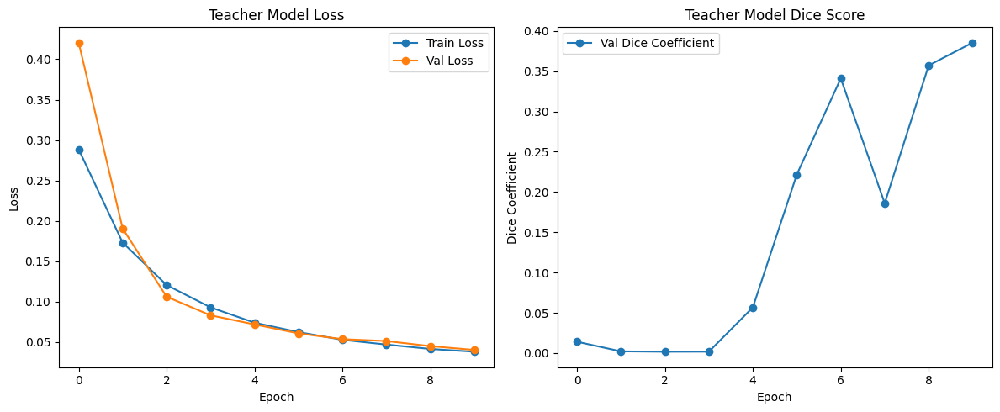

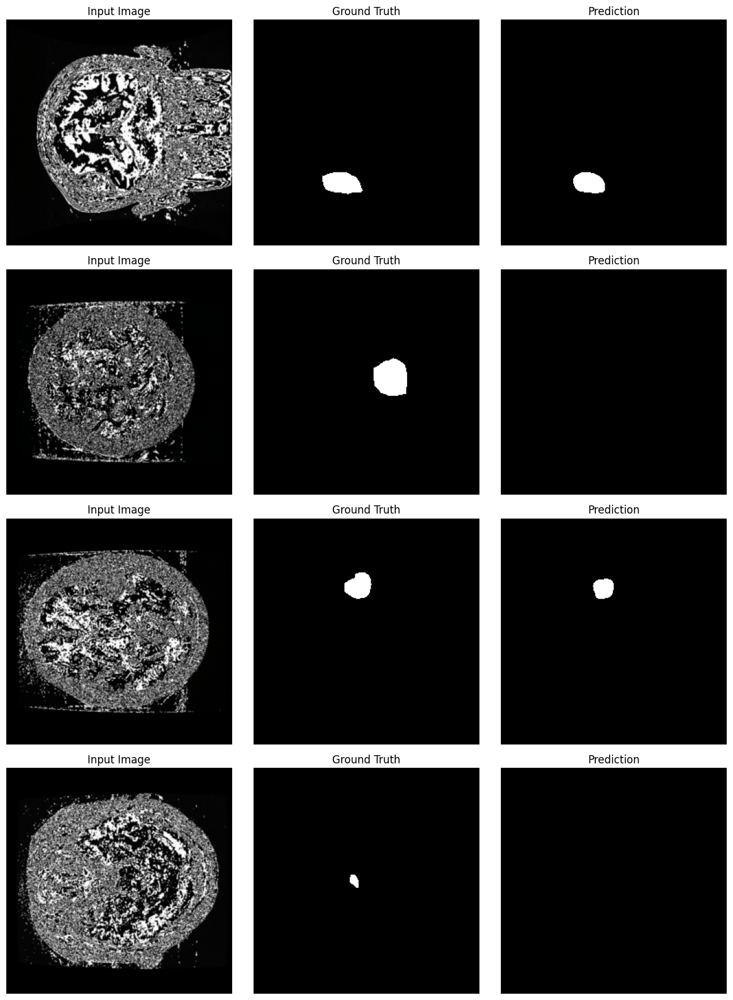

In [ ]:
import os
import glob
import numpy as np
import h5py
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

import torchvision.transforms.functional as TF
from torchvision import models

# --------------------------
# Device Setup
# --------------------------
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)
if device.type == "cuda":
    gpu_props = torch.cuda.get_device_properties(0)
    print("GPU Name:", torch.cuda.get_device_name(0))
    print("Total GPU Memory: {:.2f} GB".format(gpu_props.total_memory / (1024**3)))

# --------------------------
# Utility Function: Load MATLAB file
# --------------------------
def load_matlab_file(file_path):
    with h5py.File(file_path, 'r') as f:
        if "cjdata" in f:
            group = f["cjdata"]
            data = {key: group[key][()] for key in group.keys()}
            return data
        else:
            return {k: f[k][()] for k in f.keys()}

# --------------------------
# Data Augmentation and Preprocessing for Segmentation
# --------------------------
def seg_transform(image, mask, is_train=True, target_size=(256,256)):
    # Resize image and mask (mask uses nearest interpolation)
    image = TF.resize(image, target_size)
    mask = TF.resize(mask, target_size, interpolation=Image.NEAREST)
    if is_train:
        # Apply random horizontal flip
        if np.random.rand() > 0.5:
            image = TF.hflip(image)
            mask = TF.hflip(mask)
    # For image: convert to tensor and normalize
    image = TF.to_tensor(image)
    image = TF.normalize(image, [0.485, 0.456, 0.406],
                               [0.229, 0.224, 0.225])
    # For mask: convert to numpy array and ensure binary (0,1)
    mask = np.array(mask, dtype=np.uint8)
    if mask.max() > 1:
        mask = mask / 255.0
    mask = torch.from_numpy(mask).float().unsqueeze(0)  # add channel dim
    return image, mask

# --------------------------
# Custom Dataset for Segmentation
# --------------------------
class BrainTumorSegmentationDataset(Dataset):
    def __init__(self, file_list, is_train=True):
        self.file_list = file_list
        self.is_train = is_train

    def __len__(self):
        return len(self.file_list)

    def __getitem__(self, idx):
        file_path = self.file_list[idx]
        data = load_matlab_file(file_path)

        # Load image
        if "image" not in data:
            raise KeyError(f"'image' not found in file: {file_path}")
        image = data["image"]
        if image.ndim == 2:
            image = np.stack([image] * 3, axis=-1)
        if image.dtype != np.uint8:
            image = (255 * (image - np.min(image)) / (np.ptp(image) + 1e-8)).astype(np.uint8)
        image = Image.fromarray(image)

        # Load mask: use tumorMask if available, otherwise generate from tumorBorder.
        if "tumorMask" in data and data["tumorMask"] is not None:
            mask = data["tumorMask"]
            if mask.ndim == 2:
                mask = Image.fromarray((mask * 255).astype(np.uint8))
            else:
                mask = Image.fromarray(mask)
        elif "tumorBorder" in data and data["tumorBorder"] is not None:
            mask = Image.new("L", image.size, 0)
            draw = ImageDraw.Draw(mask)
            pts = list(np.squeeze(data["tumorBorder"]))
            pts = [(pts[i], pts[i+1]) for i in range(0, len(pts), 2)]
            draw.polygon(pts, outline=1, fill=1)
            mask = mask.convert("L")
        else:
            raise ValueError("No tumorMask or tumorBorder found in file: " + file_path)

        image, mask = seg_transform(image, mask, is_train=self.is_train, target_size=(256,256))
        return image, mask

# --------------------------
# Prepare Dataset and DataLoaders
# --------------------------
dataset_dir = "/root/.cache/kagglehub/datasets/ashkhagan/figshare-brain-tumor-dataset/versions/1"
all_files = glob.glob(os.path.join(dataset_dir, '**', '*.mat'), recursive=True)
all_files = [f for f in all_files if "cvind" not in os.path.basename(f).lower()]
print("Total .mat files found:", len(all_files))

np.random.shuffle(all_files)
split_idx = int(0.8 * len(all_files))
train_files = all_files[:split_idx]
val_files = all_files[split_idx:]
print("Train files:", len(train_files), "Validation files:", len(val_files))

train_dataset = BrainTumorSegmentationDataset(train_files, is_train=True)
val_dataset = BrainTumorSegmentationDataset(val_files, is_train=False)

batch_size = 8
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

# --------------------------
# U-Net Building Blocks for the Teacher Model
# --------------------------
class DoubleConv(nn.Module):
    """(Conv => BN => ReLU) * 2"""
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
    def forward(self, x):
        return self.double_conv(x)

class Up(nn.Module):
    """Upscaling then double conv"""
    def __init__(self, in_channels, out_channels, bilinear=True):
        super(Up, self).__init__()
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        else:
            self.up = nn.ConvTranspose2d(in_channels//2, in_channels//2, kernel_size=2, stride=2)
        self.conv = DoubleConv(in_channels, out_channels)
    def forward(self, x1, x2):
        x1 = self.up(x1)
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]
        x1 = F.pad(x1, [diffX//2, diffX - diffX//2, diffY//2, diffY - diffY//2])
        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)

# --------------------------
# Hybrid Teacher Model: U-Net + ViT Fusion
# --------------------------
class HybridTeacherModel(nn.Module):
    def __init__(self, in_channels=3, num_classes=1, bilinear=True):
        super(HybridTeacherModel, self).__init__()
        # U-Net Encoder
        self.enc1 = DoubleConv(in_channels, 64)
        self.pool1 = nn.MaxPool2d(2)
        self.enc2 = DoubleConv(64, 128)
        self.pool2 = nn.MaxPool2d(2)
        self.enc3 = DoubleConv(128, 256)
        self.pool3 = nn.MaxPool2d(2)
        self.enc4 = DoubleConv(256, 512)
        self.pool4 = nn.MaxPool2d(2)

        self.bridge = DoubleConv(512, 1024)

        # ViT branch: use a pretrained ViT with its head removed.
        self.vit = models.vit_b_16(pretrained=True)
        self.vit.heads = nn.Identity()
        vit_feature_dim = self.vit.hidden_dim  # typically 768
        self.vit_proj = nn.Linear(vit_feature_dim, 1024)

        # Decoder with skip connections
        self.up4 = Up(1024+512, 512, bilinear)
        self.up3 = Up(512+256, 256, bilinear)
        self.up2 = Up(256+128, 128, bilinear)
        self.up1 = Up(128+64, 64, bilinear)
        self.outc = nn.Conv2d(64, num_classes, kernel_size=1)

    def forward(self, x, return_features=False):
        # Encoder
        x1 = self.enc1(x)                # [B, 64, H, W]
        x2 = self.enc2(self.pool1(x1))     # [B, 128, H/2, W/2]
        x3 = self.enc3(self.pool2(x2))     # [B, 256, H/4, W/4]
        x4 = self.enc4(self.pool3(x3))     # [B, 512, H/8, W/8]
        x_bridge = self.bridge(self.pool4(x4))  # [B, 1024, H/16, W/16]

        # ViT branch: resize input to 224x224 as expected by ViT.
        vit_input = F.interpolate(x, size=(224,224), mode='bilinear', align_corners=True)
        vit_feat = self.vit(vit_input)    # shape: (B, hidden_dim)
        vit_feat = self.vit_proj(vit_feat)  # shape: (B, 1024)
        vit_feat = vit_feat.unsqueeze(-1).unsqueeze(-1)  # (B, 1024, 1, 1)
        vit_feat = vit_feat.expand_as(x_bridge)

        # Fuse ViT features with U-Net bridge features
        x_bridge = x_bridge + vit_feat

        # Decoder with skip connections
        d4 = self.up4(x_bridge, x4)  # [B, 512, H/8, W/8]
        d3 = self.up3(d4, x3)        # [B, 256, H/4, W/4]
        d2 = self.up2(d3, x2)        # [B, 128, H/2, W/2]
        d1 = self.up1(d2, x1)        # [B, 64, H, W]
        logits = self.outc(d1)       # [B, num_classes, H, W]

        if return_features:
            features = {"d4": d4, "d3": d3, "d2": d2, "d1": d1, "logits": logits}
            return logits, features
        else:
            return logits

# --------------------------
# Dice Coefficient Metric for Evaluation
# --------------------------
def dice_coeff(pred, target, smooth=1.0):
    pred = torch.sigmoid(pred)
    pred = (pred > 0.5).float()
    intersection = (pred * target).sum(dim=(1,2,3))
    dice = (2. * intersection + smooth) / (pred.sum(dim=(1,2,3)) + target.sum(dim=(1,2,3)) + smooth)
    return dice.mean()

# --------------------------
# Teacher Model Training Loop
# --------------------------
teacher_model = HybridTeacherModel(in_channels=3, num_classes=1).to(device)
criterion_seg = nn.BCEWithLogitsLoss()
optimizer_teacher = optim.Adam(teacher_model.parameters(), lr=1e-4)

num_epochs_teacher = 10
train_losses = []
val_losses = []
val_dices = []

print("\n--- Training Teacher Model ---")
for epoch in range(num_epochs_teacher):
    teacher_model.train()
    running_loss = 0.0
    for images, masks in train_loader:
        images, masks = images.to(device), masks.to(device)
        optimizer_teacher.zero_grad()
        outputs = teacher_model(images)
        loss = criterion_seg(outputs, masks)
        loss.backward()
        optimizer_teacher.step()
        running_loss += loss.item() * images.size(0)
    epoch_loss = running_loss / len(train_loader.dataset)
    train_losses.append(epoch_loss)

    teacher_model.eval()
    running_loss_val = 0.0
    dice_score = 0.0
    with torch.no_grad():
        for images, masks in val_loader:
            images, masks = images.to(device), masks.to(device)
            outputs = teacher_model(images)
            loss = criterion_seg(outputs, masks)
            running_loss_val += loss.item() * images.size(0)
            dice_score += dice_coeff(outputs, masks).item() * images.size(0)
    val_loss = running_loss_val / len(val_loader.dataset)
    dice_score = dice_score / len(val_loader.dataset)
    val_losses.append(val_loss)
    val_dices.append(dice_score)

    print(f"Epoch [{epoch+1}/{num_epochs_teacher}] Train Loss: {epoch_loss:.4f} | Val Loss: {val_loss:.4f} | Dice: {dice_score:.4f}")

# Save the trained teacher model
teacher_model_path = "teacher_hybrid_unet_vit_seg.pth"
torch.save(teacher_model.state_dict(), teacher_model_path)
print(f"Teacher model saved to {teacher_model_path}")

# --------------------------
# Visualization: Training Curves
# --------------------------
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(train_losses, label="Train Loss", marker='o')
plt.plot(val_losses, label="Val Loss", marker='o')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Teacher Model Loss")
plt.legend()

plt.subplot(1,2,2)
plt.plot(val_dices, label="Val Dice Coefficient", marker='o')
plt.xlabel("Epoch")
plt.ylabel("Dice Coefficient")
plt.title("Teacher Model Dice Score")
plt.legend()
plt.tight_layout()
plt.show()

# --------------------------
# Visualization: Sample Predictions from Teacher Model
# --------------------------
teacher_model.eval()
sample_loader = DataLoader(val_dataset, batch_size=4, shuffle=True)
images, masks = next(iter(sample_loader))
images = images.to(device)
with torch.no_grad():
    outputs = teacher_model(images)
preds = torch.sigmoid(outputs)
preds = (preds > 0.5).float()
images = images.cpu()

# Function to undo normalization for visualization
def inv_normalize(img_tensor):
    inv_trans = TF.normalize(img_tensor, [-0.485/0.229, -0.456/0.224, -0.406/0.225],
                             [1/0.229, 1/0.224, 1/0.225])
    return torch.clamp(inv_trans, 0, 1)

fig, axes = plt.subplots(4, 3, figsize=(12,16))
for i in range(4):
    img = inv_normalize(images[i])
    mask = masks[i].squeeze(0)
    pred = preds[i].squeeze(0)
    axes[i,0].imshow(img.permute(1,2,0))
    axes[i,0].set_title("Input Image")
    axes[i,0].axis("off")
    axes[i,1].imshow(mask, cmap="gray")
    axes[i,1].set_title("Ground Truth")
    axes[i,1].axis("off")
    axes[i,2].imshow(pred.cpu().squeeze(0), cmap="gray")
    axes[i,2].set_title("Prediction")
    axes[i,2].axis("off")
plt.tight_layout()
plt.show()


Using device: cuda:0
Train files: 2451 Validation files: 613


<ipython-input-19-6cb981a892e6>:283: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  teacher_model.load_state_dict(torch.load(teacher_model_path))



--- Training Student Model with Knowledge Distillation ---
Epoch [1/14] Total Loss: 10.0163 | Val Loss: 0.3669 | Dice: 0.0066
Epoch [2/14] Total Loss: 7.7293 | Val Loss: 0.5936 | Dice: 0.0083
Epoch [3/14] Total Loss: 6.0859 | Val Loss: 0.1817 | Dice: 0.0018
Epoch [4/14] Total Loss: 4.6751 | Val Loss: 0.1529 | Dice: 0.0051
Epoch [5/14] Total Loss: 3.4977 | Val Loss: 0.2945 | Dice: 0.0079
Epoch [6/14] Total Loss: 2.6039 | Val Loss: 0.0775 | Dice: 0.0028
Epoch [7/14] Total Loss: 1.8834 | Val Loss: 0.0620 | Dice: 0.0105
Epoch [8/14] Total Loss: 1.4023 | Val Loss: 0.0614 | Dice: 0.0387
Epoch [9/14] Total Loss: 1.1563 | Val Loss: 0.0515 | Dice: 0.2381
Epoch [10/14] Total Loss: 0.9910 | Val Loss: 0.0486 | Dice: 0.2933
Epoch [11/14] Total Loss: 0.8430 | Val Loss: 0.0450 | Dice: 0.3552
Epoch [12/14] Total Loss: 0.7434 | Val Loss: 0.0448 | Dice: 0.3282
Epoch [13/14] Total Loss: 0.6802 | Val Loss: 0.0431 | Dice: 0.3637
Epoch [14/14] Total Loss: 0.6308 | Val Loss: 0.0426 | Dice: 0.3752
Student mo

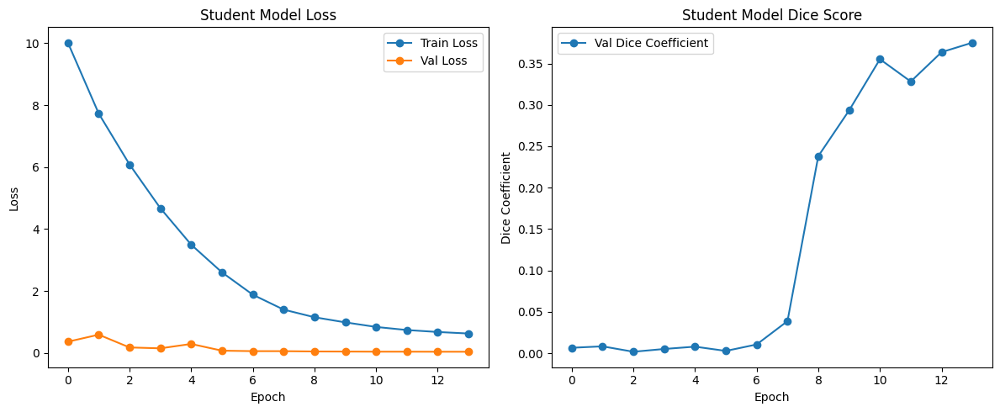

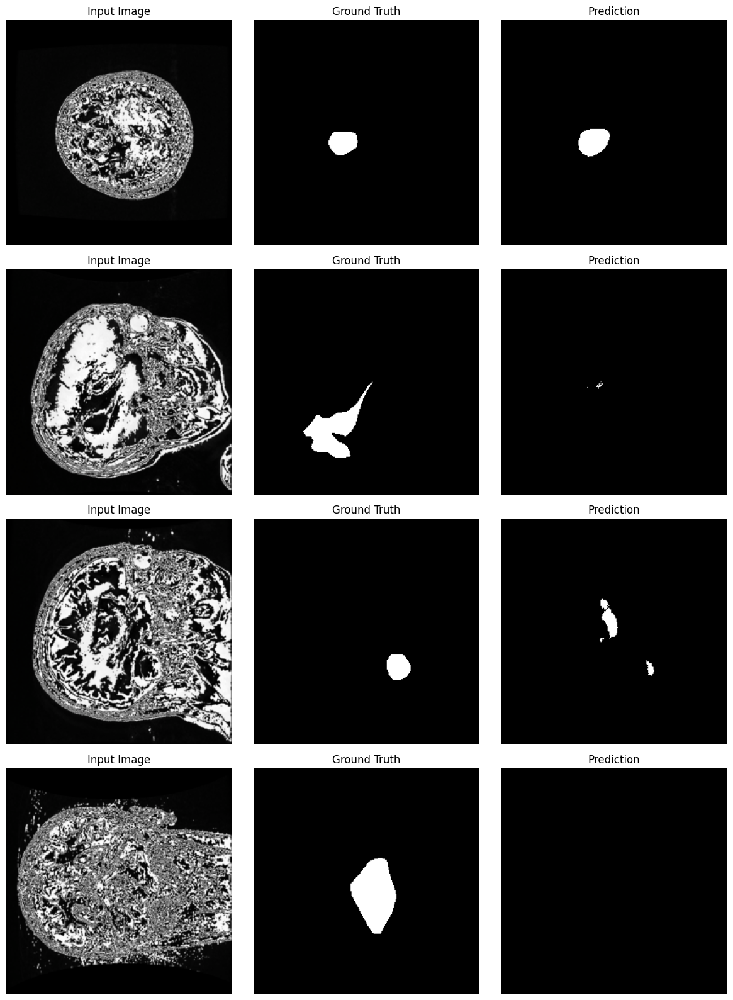

In [19]:
import os
import glob
import numpy as np
import h5py
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

import torchvision.transforms.functional as TF
from torchvision import models

# --------------------------
# Device Setup
# --------------------------
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# --------------------------
# Utility Function: Load MATLAB file
# --------------------------
def load_matlab_file(file_path):
    with h5py.File(file_path, 'r') as f:
        if "cjdata" in f:
            group = f["cjdata"]
            data = {key: group[key][()] for key in group.keys()}
            return data
        else:
            return {k: f[k][()] for k in f.keys()}

# --------------------------
# Data Augmentation and Preprocessing for Segmentation
# --------------------------
def seg_transform(image, mask, is_train=True, target_size=(256,256)):
    # Resize image and mask (mask uses nearest interpolation)
    image = TF.resize(image, target_size)
    mask = TF.resize(mask, target_size, interpolation=Image.NEAREST)
    if is_train:
        # Apply random horizontal flip
        if np.random.rand() > 0.5:
            image = TF.hflip(image)
            mask = TF.hflip(mask)
    # For image: convert to tensor and normalize
    image = TF.to_tensor(image)
    image = TF.normalize(image, [0.485, 0.456, 0.406],
                               [0.229, 0.224, 0.225])
    # For mask: convert to numpy array and ensure binary (0,1)
    mask = np.array(mask, dtype=np.uint8)
    if mask.max() > 1:
        mask = mask / 255.0
    mask = torch.from_numpy(mask).float().unsqueeze(0)  # add channel dim
    return image, mask

# --------------------------
# Custom Dataset for Segmentation
# --------------------------
class BrainTumorSegmentationDataset(Dataset):
    def __init__(self, file_list, is_train=True):
        self.file_list = file_list
        self.is_train = is_train

    def __len__(self):
        return len(self.file_list)

    def __getitem__(self, idx):
        file_path = self.file_list[idx]
        data = load_matlab_file(file_path)

        # Load image
        if "image" not in data:
            raise KeyError(f"'image' not found in file: {file_path}")
        image = data["image"]
        if image.ndim == 2:
            image = np.stack([image] * 3, axis=-1)
        if image.dtype != np.uint8:
            image = (255 * (image - np.min(image)) / (np.ptp(image)+1e-8)).astype(np.uint8)
        image = Image.fromarray(image)

        # Load mask: use tumorMask if available; otherwise generate from tumorBorder.
        if "tumorMask" in data and data["tumorMask"] is not None:
            mask = data["tumorMask"]
            if mask.ndim == 2:
                mask = Image.fromarray((mask*255).astype(np.uint8))
            else:
                mask = Image.fromarray(mask)
        elif "tumorBorder" in data and data["tumorBorder"] is not None:
            mask = Image.new("L", image.size, 0)
            draw = ImageDraw.Draw(mask)
            pts = list(np.squeeze(data["tumorBorder"]))
            pts = [(pts[i], pts[i+1]) for i in range(0, len(pts), 2)]
            draw.polygon(pts, outline=1, fill=1)
            mask = mask.convert("L")
        else:
            raise ValueError("No tumorMask or tumorBorder found in file: " + file_path)

        image, mask = seg_transform(image, mask, is_train=self.is_train, target_size=(256,256))
        return image, mask

# --------------------------
# U-Net Building Blocks
# --------------------------
class DoubleConv(nn.Module):
    """(Conv => BN => ReLU) * 2"""
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.double_conv = nn.Sequential(
           nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
           nn.BatchNorm2d(out_channels),
           nn.ReLU(inplace=True),
           nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
           nn.BatchNorm2d(out_channels),
           nn.ReLU(inplace=True)
        )
    def forward(self, x):
        return self.double_conv(x)

class Up(nn.Module):
    """Upscaling then double conv"""
    def __init__(self, in_channels, out_channels, bilinear=True):
        super(Up, self).__init__()
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        else:
            self.up = nn.ConvTranspose2d(in_channels//2, in_channels//2, kernel_size=2, stride=2)
        self.conv = DoubleConv(in_channels, out_channels)
    def forward(self, x1, x2):
        x1 = self.up(x1)
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]
        x1 = F.pad(x1, [diffX//2, diffX - diffX//2, diffY//2, diffY - diffY//2])
        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)

# --------------------------
# Dice Coefficient Metric for Evaluation
# --------------------------
def dice_coeff(pred, target, smooth=1.0):
    pred = torch.sigmoid(pred)
    pred = (pred > 0.5).float()
    intersection = (pred * target).sum(dim=(1,2,3))
    dice = (2. * intersection + smooth) / (pred.sum(dim=(1,2,3)) + target.sum(dim=(1,2,3)) + smooth)
    return dice.mean()

# --------------------------
# Inverse Normalization (for Visualization)
# --------------------------
def inv_normalize(img_tensor):
    inv_trans = TF.normalize(img_tensor, [-0.485/0.229, -0.456/0.224, -0.406/0.225],
                             [1/0.229, 1/0.224, 1/0.225])
    return torch.clamp(inv_trans, 0, 1)

# --------------------------
# Hybrid Teacher Model: U-Net + ViT Fusion
# --------------------------
class HybridTeacherModel(nn.Module):
    def __init__(self, in_channels=3, num_classes=1, bilinear=True):
        super(HybridTeacherModel, self).__init__()
        # U-Net Encoder
        self.enc1 = DoubleConv(in_channels, 64)
        self.pool1 = nn.MaxPool2d(2)
        self.enc2 = DoubleConv(64, 128)
        self.pool2 = nn.MaxPool2d(2)
        self.enc3 = DoubleConv(128, 256)
        self.pool3 = nn.MaxPool2d(2)
        self.enc4 = DoubleConv(256, 512)
        self.pool4 = nn.MaxPool2d(2)

        self.bridge = DoubleConv(512, 1024)

        # ViT branch: use a pretrained ViT with its head removed.
        self.vit = models.vit_b_16(pretrained=True)
        self.vit.heads = nn.Identity()
        vit_feature_dim = self.vit.hidden_dim  # typically 768
        self.vit_proj = nn.Linear(vit_feature_dim, 1024)

        # Decoder with skip connections
        self.up4 = Up(1024+512, 512, bilinear)
        self.up3 = Up(512+256, 256, bilinear)
        self.up2 = Up(256+128, 128, bilinear)
        self.up1 = Up(128+64, 64, bilinear)
        self.outc = nn.Conv2d(64, num_classes, kernel_size=1)

    def forward(self, x, return_features=False):
        # Encoder
        x1 = self.enc1(x)                # [B, 64, H, W]
        x2 = self.enc2(self.pool1(x1))     # [B, 128, H/2, W/2]
        x3 = self.enc3(self.pool2(x2))     # [B, 256, H/4, W/4]
        x4 = self.enc4(self.pool3(x3))     # [B, 512, H/8, W/8]
        x_bridge = self.bridge(self.pool4(x4))  # [B, 1024, H/16, W/16]

        # ViT branch: resize input to 224x224 as expected by ViT.
        vit_input = F.interpolate(x, size=(224,224), mode='bilinear', align_corners=True)
        vit_feat = self.vit(vit_input)    # shape: (B, hidden_dim)
        vit_feat = self.vit_proj(vit_feat)  # shape: (B, 1024)
        vit_feat = vit_feat.unsqueeze(-1).unsqueeze(-1)  # (B, 1024, 1, 1)
        vit_feat = vit_feat.expand_as(x_bridge)

        # Fuse ViT features with U-Net bridge features
        x_bridge = x_bridge + vit_feat

        # Decoder with skip connections
        d4 = self.up4(x_bridge, x4)  # [B, 512, H/8, W/8]
        d3 = self.up3(d4, x3)        # [B, 256, H/4, W/4]
        d2 = self.up2(d3, x2)        # [B, 128, H/2, W/2]
        d1 = self.up1(d2, x1)        # [B, 64, H, W]
        logits = self.outc(d1)       # [B, num_classes, H, W]

        if return_features:
            features = {"d4": d4, "d3": d3, "d2": d2, "d1": d1, "logits": logits}
            return logits, features
        else:
            return logits

# --------------------------
# Student Model Definition (Simpler U-Net)
# --------------------------
class StudentUNet(nn.Module):
    def __init__(self, in_channels=3, num_classes=1, bilinear=True):
        super(StudentUNet, self).__init__()
        self.enc1 = DoubleConv(in_channels, 32)
        self.pool1 = nn.MaxPool2d(2)
        self.enc2 = DoubleConv(32, 64)
        self.pool2 = nn.MaxPool2d(2)
        self.enc3 = DoubleConv(64, 128)
        self.pool3 = nn.MaxPool2d(2)
        self.enc4 = DoubleConv(128, 256)
        self.pool4 = nn.MaxPool2d(2)

        self.bridge = DoubleConv(256, 512)

        self.up4 = Up(512+256, 256, bilinear)
        self.up3 = Up(256+128, 128, bilinear)
        self.up2 = Up(128+64, 64, bilinear)
        self.up1 = Up(64+32, 32, bilinear)
        self.outc = nn.Conv2d(32, num_classes, kernel_size=1)

    def forward(self, x, return_features=False):
        x1 = self.enc1(x)              # [B, 32, H, W]
        x2 = self.enc2(self.pool1(x1))   # [B, 64, H/2, W/2]
        x3 = self.enc3(self.pool2(x2))   # [B, 128, H/4, W/4]
        x4 = self.enc4(self.pool3(x3))   # [B, 256, H/8, W/8]
        x_bridge = self.bridge(self.pool4(x4))  # [B, 512, H/16, W/16]

        d4 = self.up4(x_bridge, x4)      # [B, 256, H/8, W/8]
        d3 = self.up3(d4, x3)            # [B, 128, H/4, W/4]
        d2 = self.up2(d3, x2)            # [B, 64, H/2, W/2]
        d1 = self.up1(d2, x1)            # [B, 32, H, W]
        logits = self.outc(d1)           # [B, num_classes, H, W]

        if return_features:
            features = {"d4": d4, "d3": d3, "d2": d2, "d1": d1, "logits": logits}
            return logits, features
        else:
            return logits

# --------------------------
# Prepare Dataset and DataLoaders
# --------------------------
dataset_dir = "/root/.cache/kagglehub/datasets/ashkhagan/figshare-brain-tumor-dataset/versions/1"
all_files = glob.glob(os.path.join(dataset_dir, '**', '*.mat'), recursive=True)
all_files = [f for f in all_files if "cvind" not in os.path.basename(f).lower()]
np.random.shuffle(all_files)
split_idx = int(0.8 * len(all_files))
train_files = all_files[:split_idx]
val_files = all_files[split_idx:]
print("Train files:", len(train_files), "Validation files:", len(val_files))

train_dataset = BrainTumorSegmentationDataset(train_files, is_train=True)
val_dataset = BrainTumorSegmentationDataset(val_files, is_train=False)
batch_size = 8
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

# --------------------------
# Load the Pre-trained Teacher Model and Freeze its Weights
# --------------------------
teacher_model_path = "teacher_hybrid_unet_vit_seg.pth"
teacher_model = HybridTeacherModel(in_channels=3, num_classes=1).to(device)
teacher_model.load_state_dict(torch.load(teacher_model_path))
teacher_model.eval()
for param in teacher_model.parameters():
    param.requires_grad = False

# --------------------------
# Define Projection Layers to Align Teacher Features with Student Features
# Teacher features: d4 (512 -> 256), d3 (256 -> 128), d2 (128 -> 64), d1 (64 -> 32)
# --------------------------
teacher_feature_proj = nn.ModuleDict({
    "d4": nn.Conv2d(512, 256, kernel_size=1),
    "d3": nn.Conv2d(256, 128, kernel_size=1),
    "d2": nn.Conv2d(128, 64, kernel_size=1),
    "d1": nn.Conv2d(64, 32, kernel_size=1)
}).to(device)

# --------------------------
# Instantiate the Student Model, Optimizer, and Loss Functions
# --------------------------
student_model = StudentUNet(in_channels=3, num_classes=1).to(device)
optimizer_student = optim.Adam(student_model.parameters(), lr=1e-4)
criterion_seg = nn.BCEWithLogitsLoss()  # Segmentation loss
criterion_feature = nn.MSELoss()         # Feature distillation loss

# Hyperparameters for distillation losses
alpha = 1.0   # Weight for segmentation loss against ground truth
beta = 0.5    # Weight for output-level (logit) distillation loss
gamma = 0.5   # Weight for multi-scale feature-level distillation loss

# --------------------------
# Knowledge Distillation Training Loop
# --------------------------
num_epochs_student = 14
train_losses_student = []
val_losses_student = []
val_dices_student = []

print("\n--- Training Student Model with Knowledge Distillation ---")
for epoch in range(num_epochs_student):
    student_model.train()
    running_loss = 0.0
    for images, masks in train_loader:
        images, masks = images.to(device), masks.to(device)
        optimizer_student.zero_grad()
        # Teacher forward pass (frozen)
        with torch.no_grad():
            teacher_logits, teacher_feats = teacher_model(images, return_features=True)
        # Student forward pass
        student_logits, student_feats = student_model(images, return_features=True)
        # Segmentation loss against ground truth
        loss_seg = criterion_seg(student_logits, masks)
        # Output-level distillation loss (MSE between student and teacher logits)
        loss_out = F.mse_loss(student_logits, teacher_logits)
        # Multi-scale feature-level distillation loss:
        loss_feat = 0.0
        for key in ["d4", "d3", "d2", "d1"]:
            # Project teacher features to the student channel dimensions.
            teacher_feat_aligned = teacher_feature_proj[key](teacher_feats[key])
            loss_feat += criterion_feature(student_feats[key], teacher_feat_aligned)
        total_loss = alpha * loss_seg + beta * loss_out + gamma * loss_feat
        total_loss.backward()
        optimizer_student.step()
        running_loss += total_loss.item() * images.size(0)
    epoch_loss = running_loss / len(train_loader.dataset)
    train_losses_student.append(epoch_loss)

    # Validation loop for student model
    student_model.eval()
    running_loss_val = 0.0
    dice_score = 0.0
    with torch.no_grad():
        for images, masks in val_loader:
            images, masks = images.to(device), masks.to(device)
            outputs = student_model(images)
            loss = criterion_seg(outputs, masks)
            running_loss_val += loss.item() * images.size(0)
            dice_score += dice_coeff(outputs, masks).item() * images.size(0)
    val_loss = running_loss_val / len(val_loader.dataset)
    dice_score = dice_score / len(val_loader.dataset)
    val_losses_student.append(val_loss)
    val_dices_student.append(dice_score)
    print(f"Epoch [{epoch+1}/{num_epochs_student}] Total Loss: {epoch_loss:.4f} | Val Loss: {val_loss:.4f} | Dice: {dice_score:.4f}")

# Save the distilled student model
student_model_path = "student_unet_distilled_seg.pth"
torch.save(student_model.state_dict(), student_model_path)
print(f"Student model saved to {student_model_path}")

# --------------------------
# Visualization: Training Curves
# --------------------------
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(train_losses_student, label="Train Loss", marker='o')
plt.plot(val_losses_student, label="Val Loss", marker='o')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Student Model Loss")
plt.legend()

plt.subplot(1,2,2)
plt.plot(val_dices_student, label="Val Dice Coefficient", marker='o')
plt.xlabel("Epoch")
plt.ylabel("Dice Coefficient")
plt.title("Student Model Dice Score")
plt.legend()
plt.tight_layout()
plt.show()

# --------------------------
# Visualization: Sample Predictions from Student Model
# --------------------------
student_model.eval()
sample_loader = DataLoader(val_dataset, batch_size=4, shuffle=True)
images, masks = next(iter(sample_loader))
images = images.to(device)
with torch.no_grad():
    outputs = student_model(images)
preds = torch.sigmoid(outputs)
preds = (preds > 0.5).float()
images = images.cpu()

fig, axes = plt.subplots(4, 3, figsize=(12,16))
for i in range(4):
    img = inv_normalize(images[i])
    mask = masks[i].squeeze(0)
    pred = preds[i].squeeze(0)
    axes[i,0].imshow(img.permute(1,2,0))
    axes[i,0].set_title("Input Image")
    axes[i,0].axis("off")
    axes[i,1].imshow(mask, cmap="gray")
    axes[i,1].set_title("Ground Truth")
    axes[i,1].axis("off")
    axes[i,2].imshow(pred.cpu().squeeze(0), cmap="gray")
    axes[i,2].set_title("Prediction")
    axes[i,2].axis("off")
plt.tight_layout()
plt.show()
